In [2]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import os
import zipfile

In [5]:
# Dataset ZIP Path
zip_path = "/content/drive/MyDrive/Brain Tumor Classifcation-20260507T131307Z-3-001.zip"

In [6]:
# Extraction Directory
extract_path = "/content/brain_tumor_dataset"


In [7]:
# Create extraction folder if not exists
os.makedirs(extract_path, exist_ok=True)

In [8]:
# Unzip Dataset
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("Dataset extracted successfully!")
print(f"Dataset location: {extract_path}")

print("\nFolders inside dataset:\n")

for item in os.listdir(extract_path):
    print(item)

Dataset extracted successfully!
Dataset location: /content/brain_tumor_dataset

Folders inside dataset:

Brain Tumor Classifcation


In [9]:
# Import libraries for file and directory handling
import os
import random
import hashlib

# Import libraries for numerical computation and data analysis
import numpy as np
import pandas as pd

# Import visualization libraries for exploratory data analysis
import matplotlib.pyplot as plt
import seaborn as sns

# Import image processing libraries
from PIL import Image, ImageFile

# Import TensorFlow and Keras libraries for deep learning and preprocessing
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Import utility for handling class imbalance
from sklearn.utils.class_weight import compute_class_weight

# Allow loading of truncated or partially corrupted image files
ImageFile.LOAD_TRUNCATED_IMAGES = True

In [10]:
dataset_path = "/content/brain_tumor_dataset/Brain Tumor Classifcation"

# Define training and testing folder paths
train_path = os.path.join(dataset_path, "train")
test_path = os.path.join(dataset_path, "test")

# Get the list of class names from the training folder
classes = sorted(os.listdir(train_path))

# Display dataset information
print("Dataset Path:")
print(dataset_path)

print("\nTraining Path:")
print(train_path)

print("\nTesting Path:")
print(test_path)

print("\nClasses Found:")
print(classes)

Dataset Path:
/content/brain_tumor_dataset/Brain Tumor Classifcation

Training Path:
/content/brain_tumor_dataset/Brain Tumor Classifcation/train

Testing Path:
/content/brain_tumor_dataset/Brain Tumor Classifcation/test

Classes Found:
['glioma_tumor', 'meningioma_tumor', 'normal', 'pituitary_tumor']


In [11]:
# Count images in each class
def count_images_by_class(folder_path, class_names):
    counts = {}

    for class_name in class_names:
        class_path = os.path.join(folder_path, class_name)

        image_files = [
            file for file in os.listdir(class_path)
            if file.lower().endswith((".jpg", ".jpeg", ".png"))
        ]

        counts[class_name] = len(image_files)

    return counts


train_counts = count_images_by_class(train_path, classes)
test_counts = count_images_by_class(test_path, classes)

In [12]:
# Create dataframe for dataset summary
eda_df = pd.DataFrame({
    "Class": classes,
    "Train Images": [train_counts[class_name] for class_name in classes],
    "Test Images": [test_counts[class_name] for class_name in classes]
})

eda_df["Total Images"] = eda_df["Train Images"] + eda_df["Test Images"]

# Display dataset statistics
print(eda_df)

print("\nTotal Training Images:", eda_df["Train Images"].sum())
print("Total Testing Images:", eda_df["Test Images"].sum())
print("Total Images:", eda_df["Total Images"].sum())

              Class  Train Images  Test Images  Total Images
0      glioma_tumor           720          181           901
1  meningioma_tumor           730          183           913
2            normal           350           88           438
3   pituitary_tumor           675          169           844

Total Training Images: 2475
Total Testing Images: 621
Total Images: 3096


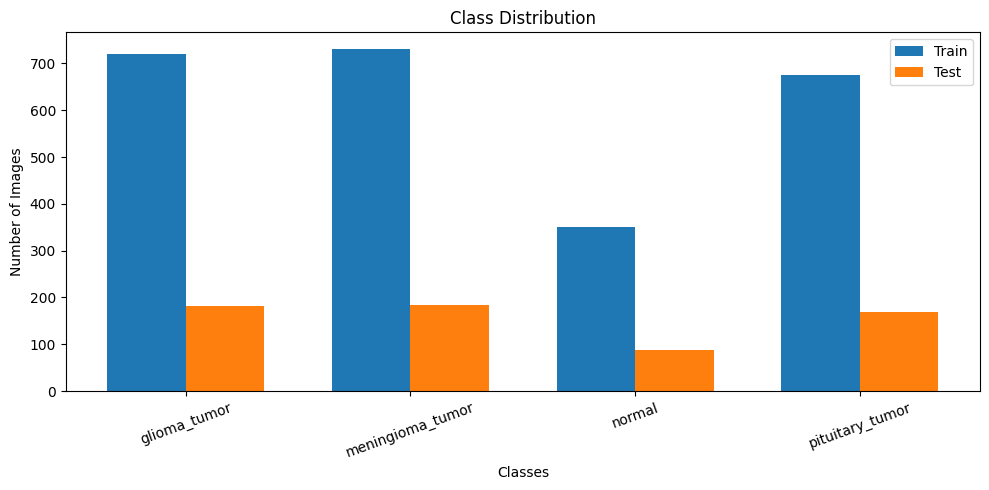

In [13]:
# Visualize class distribution
plt.figure(figsize=(10, 5))

x = np.arange(len(classes))
width = 0.35

plt.bar(x - width / 2, eda_df["Train Images"], width, label="Train")
plt.bar(x + width / 2, eda_df["Test Images"], width, label="Test")

plt.xticks(x, classes, rotation=20)
plt.xlabel("Classes")
plt.ylabel("Number of Images")
plt.title("Class Distribution")

plt.legend()
plt.tight_layout()
plt.show()

In [14]:
# Check class imbalance
total_per_class = eda_df["Total Images"].values

imbalance_ratio = total_per_class.max() / total_per_class.min()

largest_class = eda_df.loc[
    eda_df["Total Images"].idxmax(),
    "Class"
]

smallest_class = eda_df.loc[
    eda_df["Total Images"].idxmin(),
    "Class"
]

print("Largest Class:", largest_class)
print("Smallest Class:", smallest_class)
print("Imbalance Ratio:", round(imbalance_ratio, 2), ": 1")

Largest Class: meningioma_tumor
Smallest Class: normal
Imbalance Ratio: 2.08 : 1


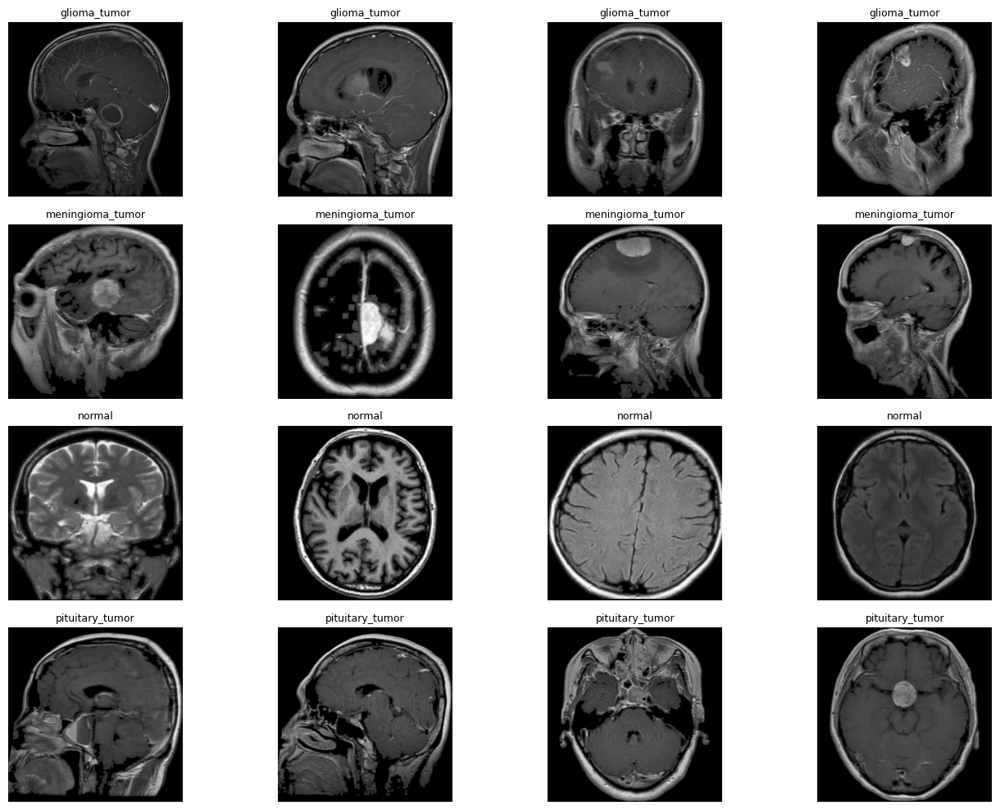

In [16]:
from PIL import Image, UnidentifiedImageError
import os, random
import matplotlib.pyplot as plt

def show_sample_images(folder_path, class_names, samples_per_class=4):

    plt.figure(figsize=(14, 10))
    plot_index = 1

    for class_name in class_names:
        class_path = os.path.join(folder_path, class_name)

        image_files = [
            file for file in os.listdir(class_path)
            if file.lower().endswith((".jpg", ".jpeg", ".png"))
        ]

        random.shuffle(image_files)

        shown = 0

        for image_file in image_files:
            if shown >= samples_per_class:
                break

            image_path = os.path.join(class_path, image_file)

            try:
                image = Image.open(image_path).convert("RGB")
            except (UnidentifiedImageError, OSError):
                print("Skipping corrupted image:", image_path)
                continue

            plt.subplot(len(class_names), samples_per_class, plot_index)
            plt.imshow(image)
            plt.title(class_name, fontsize=9)
            plt.axis("off")

            plot_index += 1
            shown += 1

    plt.tight_layout()
    plt.show()

show_sample_images(train_path, classes)

In [17]:
# Check image dimensions and color modes
image_info = []

for class_name in classes:

    class_path = os.path.join(train_path, class_name)

    image_files = os.listdir(class_path)[:50]

    for image_file in image_files:

        image_path = os.path.join(class_path, image_file)

        try:
            image = Image.open(image_path)

            width, height = image.size

            image_info.append([
                class_name,
                width,
                height,
                image.mode
            ])

        except:
            pass


size_df = pd.DataFrame(
    image_info,
    columns=["Class", "Width", "Height", "Mode"]
)

print(size_df.head())

print("\nImage Size Distribution:")
print(
    size_df.groupby(["Width", "Height"])
    .size()
    .sort_values(ascending=False)
)

print("\nImage Color Modes:")
print(size_df["Mode"].value_counts())

          Class  Width  Height Mode
0  glioma_tumor    256     256  RGB
1  glioma_tumor    256     256  RGB
2  glioma_tumor    256     256  RGB
3  glioma_tumor    256     256  RGB
4  glioma_tumor    256     256  RGB

Image Size Distribution:
Width  Height
256    256       198
dtype: int64

Image Color Modes:
Mode
RGB    198
Name: count, dtype: int64


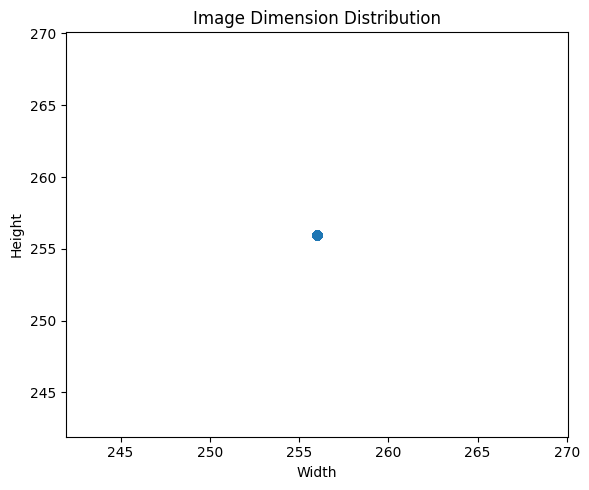

In [18]:
# Visualize image size distribution
plt.figure(figsize=(6, 5))

plt.scatter(size_df["Width"], size_df["Height"])

plt.xlabel("Width")
plt.ylabel("Height")
plt.title("Image Dimension Distribution")

plt.tight_layout()
plt.show()

In [19]:
# Detect corrupted images
corrupted_images = []

for folder in [train_path, test_path]:

    for class_name in classes:

        class_path = os.path.join(folder, class_name)

        image_files = os.listdir(class_path)

        for image_file in image_files:

            image_path = os.path.join(class_path, image_file)

            try:
                image = Image.open(image_path)
                image.verify()

            except:
                corrupted_images.append(image_path)


print("Total Corrupted Images:", len(corrupted_images))

Total Corrupted Images: 28


In [20]:
# Detect duplicate images using file hash
duplicate_hashes = {}
duplicate_images = []

for folder in [train_path, test_path]:

    for class_name in classes:

        class_path = os.path.join(folder, class_name)

        image_files = os.listdir(class_path)

        for image_file in image_files:

            image_path = os.path.join(class_path, image_file)

            try:
                with open(image_path, "rb") as file:
                    file_hash = hashlib.md5(file.read()).hexdigest()

                if file_hash in duplicate_hashes:
                    duplicate_images.append(image_path)

                else:
                    duplicate_hashes[file_hash] = image_path

            except:
                pass


print("Total Duplicate Images:", len(duplicate_images))

Total Duplicate Images: 244


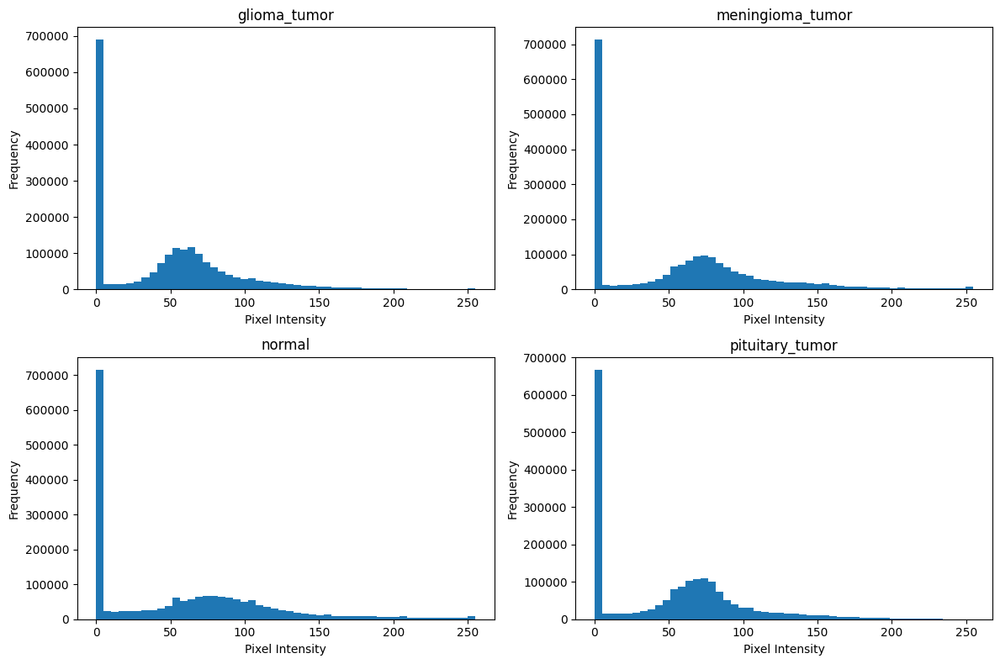

In [21]:
# Plot pixel intensity distribution
plt.figure(figsize=(12, 8))

for index, class_name in enumerate(classes):

    class_path = os.path.join(train_path, class_name)

    image_files = os.listdir(class_path)[:30]

    pixel_values = []

    for image_file in image_files:

        image_path = os.path.join(class_path, image_file)

        try:
            image = Image.open(image_path).convert("L")

            image_array = np.array(image)

            pixel_values.extend(image_array.flatten())

        except:
            pass

    plt.subplot(2, 2, index + 1)

    plt.hist(pixel_values, bins=50)

    plt.title(class_name)
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")


plt.tight_layout()
plt.show()

In [22]:
# Remove corrupted and duplicate images
removed_files = []

for image_path in corrupted_images:

    if os.path.exists(image_path):

        os.remove(image_path)

        removed_files.append(image_path)


for image_path in duplicate_images:

    if os.path.exists(image_path):

        os.remove(image_path)

        removed_files.append(image_path)


print("Total Removed Files:", len(removed_files))

Total Removed Files: 272


In [23]:
# Recount images after cleaning
train_counts_after = count_images_by_class(train_path, classes)
test_counts_after = count_images_by_class(test_path, classes)

cleaned_df = pd.DataFrame({
    "Class": classes,
    "Train Images": [train_counts_after[class_name] for class_name in classes],
    "Test Images": [test_counts_after[class_name] for class_name in classes]
})

cleaned_df["Total Images"] = cleaned_df["Train Images"] + cleaned_df["Test Images"]

print(cleaned_df)

print("\nFinal Training Images:", cleaned_df["Train Images"].sum())
print("Final Testing Images:", cleaned_df["Test Images"].sum())
print("Final Total Images:", cleaned_df["Total Images"].sum())

              Class  Train Images  Test Images  Total Images
0      glioma_tumor           701          177           878
1  meningioma_tumor           668          144           812
2            normal           259           48           307
3   pituitary_tumor           663          164           827

Final Training Images: 2291
Final Testing Images: 533
Final Total Images: 2824


In [24]:
# Configure image preprocessing and augmentation
image_size = 256
batch_size = 32

train_datagen = ImageDataGenerator(
    rescale=1.0 / 255.0,
    rotation_range=20,
    width_shift_range=0.10,
    height_shift_range=0.10,
    zoom_range=0.10,
    horizontal_flip=True,
    validation_split=0.20
)

validation_datagen = ImageDataGenerator(
    rescale=1.0 / 255.0,
    validation_split=0.20
)

test_datagen = ImageDataGenerator(
    rescale=1.0 / 255.0
)

In [25]:
# Create training, validation, and testing generators
train_generator = train_datagen.flow_from_directory(
    train_path,
    target_size=(image_size, image_size),
    batch_size=batch_size,
    class_mode="categorical",
    subset="training",
    shuffle=True
)

validation_generator = validation_datagen.flow_from_directory(
    train_path,
    target_size=(image_size, image_size),
    batch_size=batch_size,
    class_mode="categorical",
    subset="validation",
    shuffle=False
)

test_generator = test_datagen.flow_from_directory(
    test_path,
    target_size=(image_size, image_size),
    batch_size=batch_size,
    class_mode="categorical",
    shuffle=False
)

print("Training Samples:", train_generator.samples)
print("Validation Samples:", validation_generator.samples)
print("Testing Samples:", test_generator.samples)

Found 1835 images belonging to 4 classes.
Found 456 images belonging to 4 classes.
Found 533 images belonging to 4 classes.
Training Samples: 1835
Validation Samples: 456
Testing Samples: 533


In [26]:
# Calculate class weights for imbalanced dataset
class_weights = compute_class_weight(
    class_weight="balanced",
    classes=np.unique(train_generator.classes),
    y=train_generator.classes
)

class_weight_dict = dict(enumerate(class_weights))

print("Class Weights:")
print(class_weight_dict)

Class Weights:
{0: np.float64(0.8177361853832442), 1: np.float64(0.8574766355140186), 2: np.float64(2.2055288461538463), 3: np.float64(0.8639359698681732)}


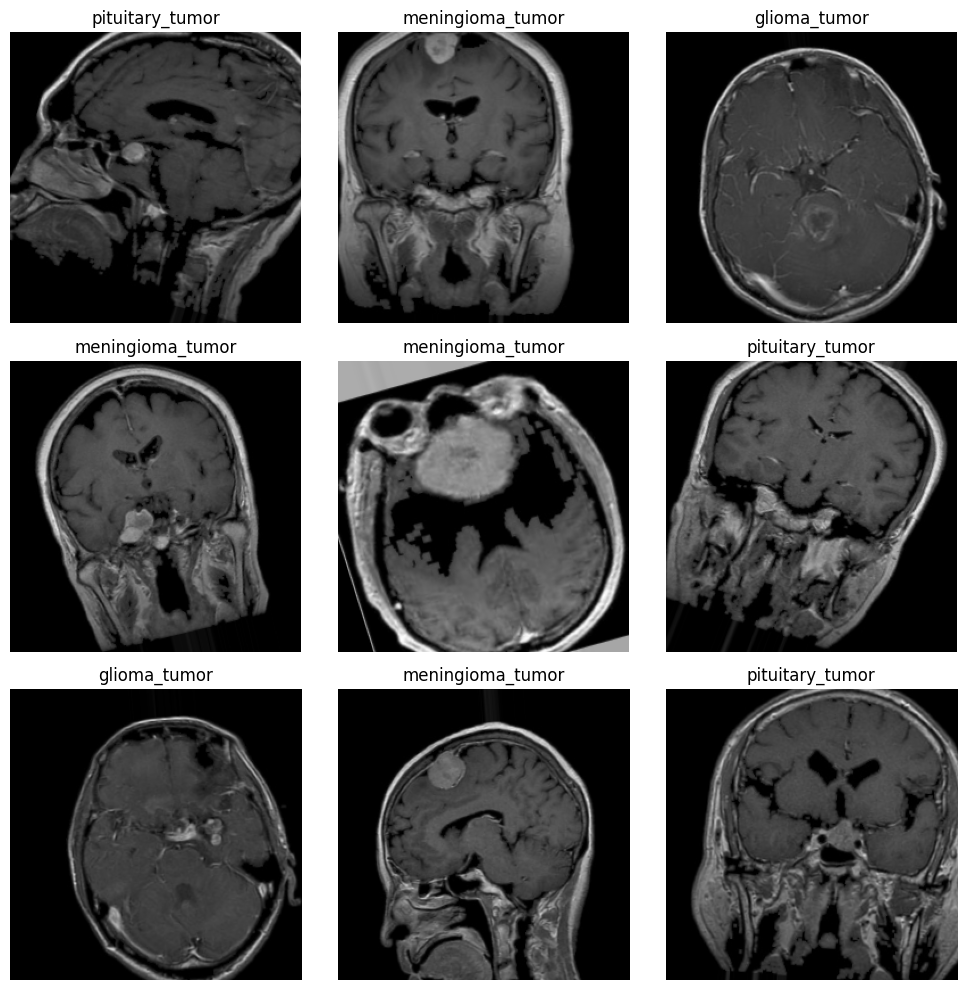

In [27]:
# Visualize augmented training images
images, labels = next(train_generator)

class_names = list(train_generator.class_indices.keys())

plt.figure(figsize=(10, 10))

for i in range(9):

    plt.subplot(3, 3, i + 1)

    plt.imshow(images[i])

    label_index = np.argmax(labels[i])

    plt.title(class_names[label_index])

    plt.axis("off")

plt.tight_layout()
plt.show()

In [28]:
# Define input shape and number of classes
input_shape = (image_size, image_size, 3)

num_classes = train_generator.num_classes

print("Input Shape:", input_shape)
print("Number of Classes:", num_classes)

Input Shape: (256, 256, 3)
Number of Classes: 4


In [29]:
# Import libraries for building CNN models
from tensorflow.keras.models import Sequential

from tensorflow.keras.layers import (
    Conv2D,
    MaxPooling2D,
    Flatten,
    Dense
)

from tensorflow.keras.optimizers import Adam

In [30]:
baseline_model = Sequential([

    Conv2D(64, (3, 3), activation="relu", input_shape=input_shape),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(128, (3, 3), activation="relu"),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(256, (3, 3), activation="relu"),
    MaxPooling2D(pool_size=(2, 2)),

    Flatten(),

    Dense(256, activation="relu"),
    Dense(128, activation="relu"),
    Dense(64, activation="relu"),

    Dense(num_classes, activation="softmax")
])

baseline_model.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 254, 254, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 127, 127, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 125, 125, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 62, 62, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 60, 60, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 30, 30, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 230400)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │    58,982,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 4)              │           260 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 59,394,884 (226.57 MB)

 Trainable params: 59,394,884 (226.57 MB)

 Non-trainable params: 0 (0.00 B)

In [31]:
# Compile baseline CNN model
baseline_model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

print("Baseline CNN model compiled successfully.")

Baseline CNN model compiled successfully.


In [32]:
# Import callbacks for better training control
from tensorflow.keras.callbacks import (
    EarlyStopping,
    ReduceLROnPlateau
)
from tensorflow.keras.callbacks import ModelCheckpoint

In [33]:
# Define training callbacks
early_stopping = EarlyStopping(
    monitor="val_loss",
    patience=5,
    restore_best_weights=True
)

reduce_lr = ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.5,
    patience=3,
    verbose=1
)

model_checkpoint = ModelCheckpoint(
    "baseline_best_model.keras",
    monitor="val_accuracy",
    save_best_only=True,
    verbose=1
)

callbacks = [
    early_stopping,
    reduce_lr,
    model_checkpoint
]

In [34]:
# Train baseline CNN model
epochs =35

baseline_history = baseline_model.fit(
    train_generator,
    epochs=epochs,
    validation_data=validation_generator,
    class_weight=class_weight_dict,
    callbacks=callbacks
)

Epoch 1/35
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 681ms/step - accuracy: 0.2666 - loss: 1.5443
Epoch 1: val_accuracy improved from None to 0.34211, saving model to baseline_best_model.keras

Epoch 1: finished saving model to baseline_best_model.keras
58/58 ━━━━━━━━━━━━━━━━━━━━ 76s 1s/step - accuracy: 0.2338 - loss: 1.4305 - val_accuracy: 0.3421 - val_loss: 1.3793 - learning_rate: 0.0010
Epoch 2/35
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 534ms/step - accuracy: 0.2865 - loss: 1.3801
Epoch 2: val_accuracy improved from 0.34211 to 0.40351, saving model to baseline_best_model.keras

Epoch 2: finished saving model to baseline_best_model.keras
58/58 ━━━━━━━━━━━━━━━━━━━━ 45s 629ms/step - accuracy: 0.3161 - loss: 1.3643 - val_accuracy: 0.4035 - val_loss: 1.3295 - learning_rate: 0.0010
Epoch 3/35
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 597ms/step - accuracy: 0.3539 - loss: 1.3322
Epoch 3: val_accuracy improved from 0.40351 to 0.49123, saving model to baseline_best_model.keras

Epoch 3: finished saving model to baseline_best

In [35]:
# Display best training results
best_epoch = np.argmax(
    baseline_history.history["val_accuracy"]
) + 1

best_val_accuracy = max(
    baseline_history.history["val_accuracy"]
)

best_val_loss = min(
    baseline_history.history["val_loss"]
)

print("Best Epoch:", best_epoch)

print(
    "Best Validation Accuracy:",
    round(best_val_accuracy, 4)
)

print(
    "Best Validation Loss:",
    round(best_val_loss, 4)
)

Best Epoch: 24
Best Validation Accuracy: 0.7259
Best Validation Loss: 0.7262


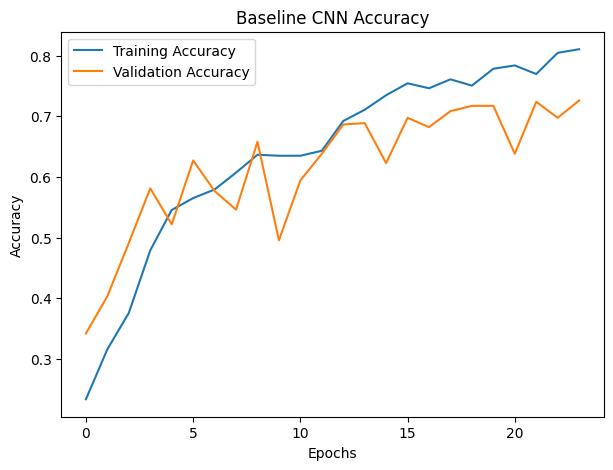

In [36]:
# Plot training and validation accuracy
plt.figure(figsize=(7, 5))

plt.plot(
    baseline_history.history["accuracy"],
    label="Training Accuracy"
)

plt.plot(
    baseline_history.history["val_accuracy"],
    label="Validation Accuracy"
)

plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Baseline CNN Accuracy")

plt.legend()
plt.show()

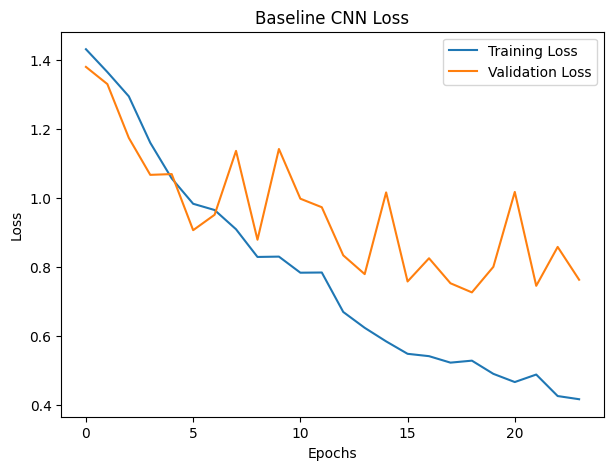

In [37]:
# Plot training and validation loss
plt.figure(figsize=(7, 5))

plt.plot(
    baseline_history.history["loss"],
    label="Training Loss"
)

plt.plot(
    baseline_history.history["val_loss"],
    label="Validation Loss"
)

plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Baseline CNN Loss")

plt.legend()
plt.show()

In [38]:
# Import evaluation metrics
from sklearn.metrics import (
    classification_report,
    confusion_matrix
)

In [39]:
# Generate predictions on test dataset
y_pred_probabilities = baseline_model.predict(
    test_generator
)

y_pred = np.argmax(
    y_pred_probabilities,
    axis=1
)

y_true = test_generator.classes

class_names = list(
    test_generator.class_indices.keys()
)

17/17 ━━━━━━━━━━━━━━━━━━━━ 6s 285ms/step


In [40]:
# Display classification metrics
print(
    classification_report(
        y_true,
        y_pred,
        target_names=class_names
    )
)

                  precision    recall  f1-score   support

    glioma_tumor       0.88      0.69      0.78       177
meningioma_tumor       0.70      0.60      0.65       144
          normal       0.76      0.92      0.83        48
 pituitary_tumor       0.76      0.98      0.85       164

        accuracy                           0.78       533
       macro avg       0.77      0.80      0.78       533
    weighted avg       0.78      0.78      0.77       533



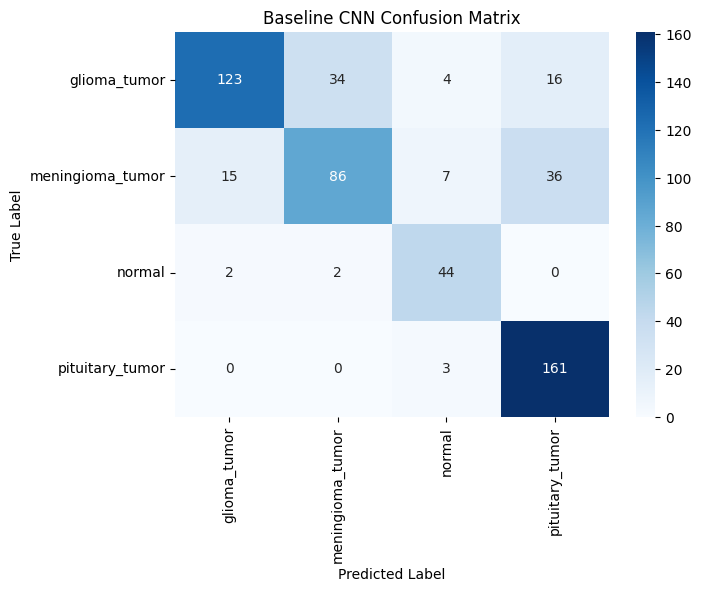

In [41]:
# Plot confusion matrix
conf_matrix = confusion_matrix(
    y_true,
    y_pred
)

plt.figure(figsize=(7, 5))

sns.heatmap(
    conf_matrix,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=class_names,
    yticklabels=class_names
)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Baseline CNN Confusion Matrix")

plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


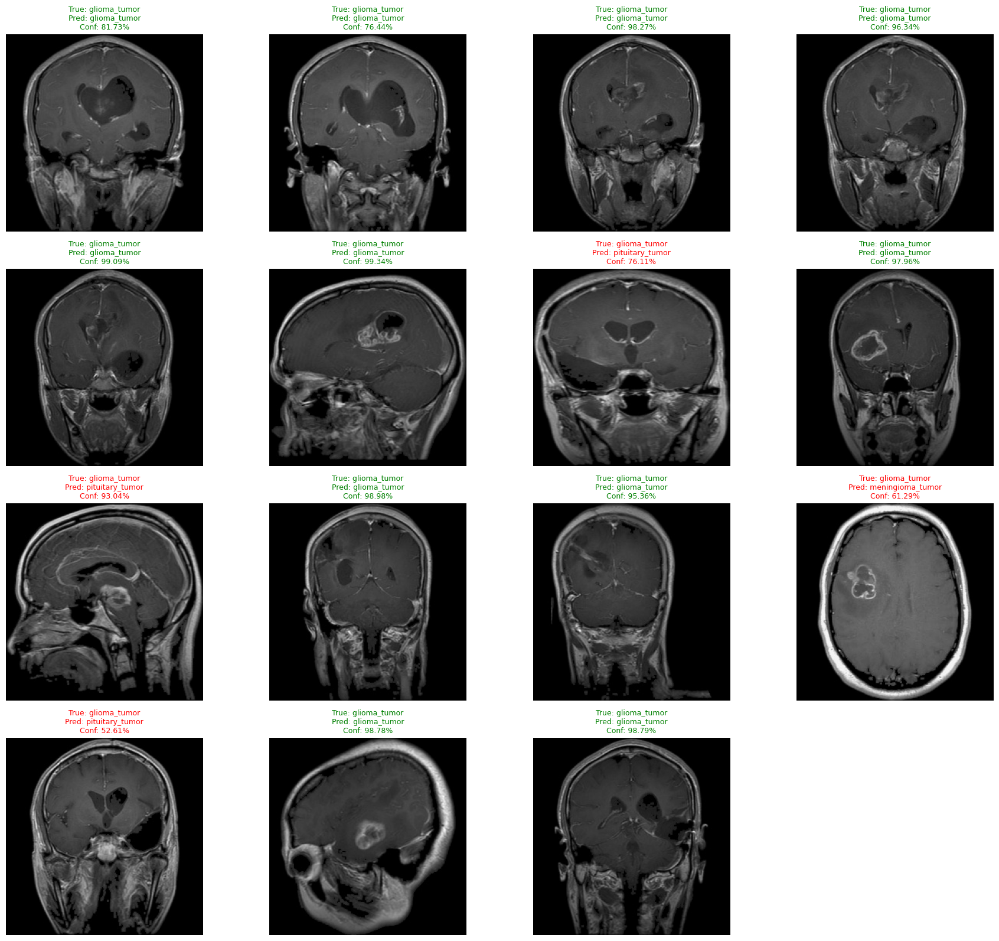

In [42]:
# Display sample predictions from test dataset
test_images, test_labels = next(test_generator)

predictions = baseline_model.predict(test_images)

plt.figure(figsize=(18, 20))

for i in range(15):

    plt.subplot(5, 4, i + 1)

    plt.imshow(test_images[i])

    true_index = np.argmax(test_labels[i])
    pred_index = np.argmax(predictions[i])

    true_label = class_names[true_index]
    predicted_label = class_names[pred_index]

    confidence = predictions[i][pred_index] * 100

    title_color = (
        "green"
        if true_index == pred_index
        else "red"
    )

    plt.title(
        f"True: {true_label}\n"
        f"Pred: {predicted_label}\n"
        f"Conf: {confidence:.2f}%",
        color=title_color,
        fontsize=9
    )

    plt.axis("off")

plt.tight_layout()
plt.show()

In [43]:
# Save final baseline CNN model
baseline_model.save("baseline_cnn_final_model.keras")

print("Baseline CNN model saved successfully.")

Baseline CNN model saved successfully.


In [44]:
# Save training history for later comparison
baseline_history_df = pd.DataFrame(baseline_history.history)

baseline_history_df.to_csv(
    "baseline_cnn_Training_history.csv",
    index=False
)

print("Baseline training history saved successfully.")

Baseline training history saved successfully.


In [45]:
# Import layers for deeper CNN architecture
from tensorflow.keras.layers import (
    BatchNormalization,GlobalAveragePooling2D,
    Dropout
)

In [46]:
deeper_model = Sequential([

    Conv2D(32, (3, 3), activation="relu", padding="same", input_shape=input_shape),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(64, (3, 3), activation="relu", padding="same"),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(128, (3, 3), activation="relu", padding="same"),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(256, (3, 3), activation="relu", padding="same"),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(512, (3, 3), activation="relu", padding="same"),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(512, (3, 3), activation="relu", padding="same"),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Flatten(),

    Dense(256, activation="relu"),
    Dropout(0.4),

    Dense(128, activation="relu"),
    Dropout(0.4),

    Dense(64, activation="relu"),

    Dense(num_classes, activation="softmax")
])

deeper_model.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 256, 256, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 256, 256, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 128, 128, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 128, 128, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 64, 64, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 64, 64, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 32, 32, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 32, 32, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 16, 16, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 16, 16, 512)    │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 8, 8, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 8, 8, 512)      │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 4, 4, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 256)            │     2,097,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 128)            │        32,89

 Total params: 6,073,220 (23.17 MB)

 Trainable params: 6,070,212 (23.16 MB)

 Non-trainable params: 3,008 (11.75 KB)

In [47]:
# Compile deeper CNN model
deeper_model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

print("Deeper CNN model compiled successfully.")

Deeper CNN model compiled successfully.


In [48]:
# Define callbacks for deeper CNN model
deeper_checkpoint = ModelCheckpoint(
    "deeper_best_model.keras",
    monitor="val_accuracy",
    save_best_only=True,
    verbose=1
)

deeper_callbacks = [
    early_stopping,
    reduce_lr,
    deeper_checkpoint
]

In [49]:
# Train deeper CNN model and record training time
import time

start_time = time.time()

deeper_history = deeper_model.fit(
    train_generator,
    epochs=35,
    validation_data=validation_generator,
    class_weight=class_weight_dict,
    callbacks=deeper_callbacks
)

end_time = time.time()

deeper_training_time = end_time - start_time

print("Deeper CNN Training Time:", round(deeper_training_time, 2), "seconds")

Epoch 1/35
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 698ms/step - accuracy: 0.3057 - loss: 3.1904
Epoch 1: val_accuracy improved from None to 0.25219, saving model to deeper_best_model.keras

Epoch 1: finished saving model to deeper_best_model.keras
58/58 ━━━━━━━━━━━━━━━━━━━━ 68s 811ms/step - accuracy: 0.3210 - loss: 2.4195 - val_accuracy: 0.2522 - val_loss: 1.4194 - learning_rate: 0.0010
Epoch 2/35
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 529ms/step - accuracy: 0.3367 - loss: 1.4505
Epoch 2: val_accuracy improved from 0.25219 to 0.29167, saving model to deeper_best_model.keras

Epoch 2: finished saving model to deeper_best_model.keras
58/58 ━━━━━━━━━━━━━━━━━━━━ 32s 550ms/step - accuracy: 0.3591 - loss: 1.3994 - val_accuracy: 0.2917 - val_loss: 1.8683 - learning_rate: 0.0010
Epoch 3/35
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 529ms/step - accuracy: 0.3845 - loss: 1.2980
Epoch 3: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 3: val_accuracy did not improve from 0.29167
58/58 ━━━━━━━━━━━━━━━━━

In [50]:
# Load the best saved deeper CNN model
deeper_model = tf.keras.models.load_model(
    "deeper_best_model.keras"
)

print("Best deeper CNN model loaded successfully.")

Best deeper CNN model loaded successfully.


In [51]:
# Display best validation results
best_epoch = np.argmax(
    deeper_history.history["val_accuracy"]
) + 1

best_val_accuracy = max(
    deeper_history.history["val_accuracy"]
)

best_val_loss = min(
    deeper_history.history["val_loss"]
)

print("Best Epoch:", best_epoch)

print(
    "Best Validation Accuracy:",
    round(best_val_accuracy, 4)
)

print(
    "Best Validation Loss:",
    round(best_val_loss, 4)
)

Best Epoch: 2
Best Validation Accuracy: 0.2917
Best Validation Loss: 1.2824


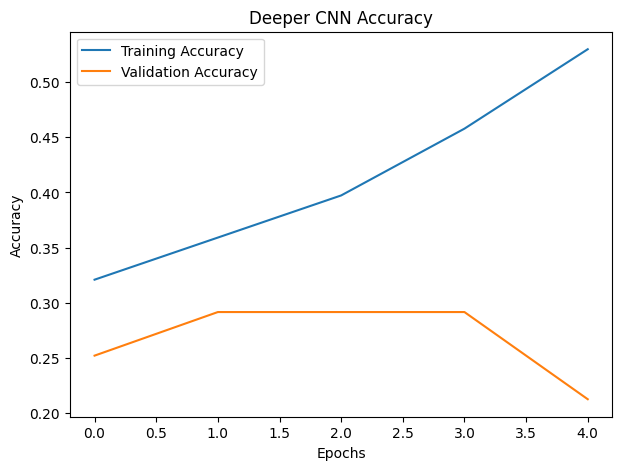

In [52]:
# Plot training and validation accuracy
plt.figure(figsize=(7, 5))

plt.plot(
    deeper_history.history["accuracy"],
    label="Training Accuracy"
)

plt.plot(
    deeper_history.history["val_accuracy"],
    label="Validation Accuracy"
)

plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Deeper CNN Accuracy")

plt.legend()
plt.show()

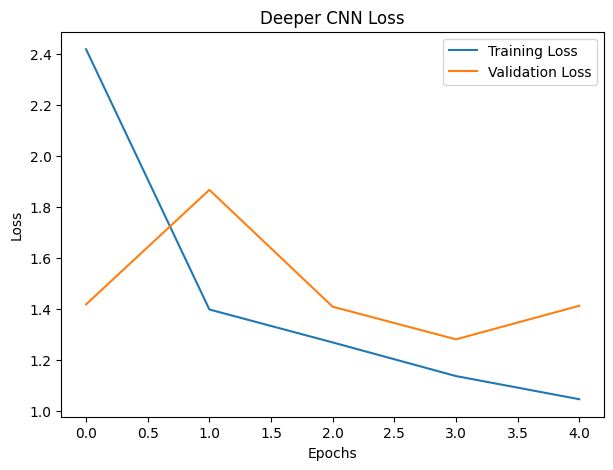

In [53]:
# Plot training and validation loss
plt.figure(figsize=(7, 5))

plt.plot(
    deeper_history.history["loss"],
    label="Training Loss"
)

plt.plot(
    deeper_history.history["val_loss"],
    label="Validation Loss"
)

plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Deeper CNN Loss")

plt.legend()
plt.show()

In [54]:
# Generate predictions on test dataset
y_pred_probabilities = deeper_model.predict(
    test_generator
)

y_pred = np.argmax(
    y_pred_probabilities,
    axis=1
)

y_true = test_generator.classes

class_names = list(
    test_generator.class_indices.keys()
)

17/17 ━━━━━━━━━━━━━━━━━━━━ 7s 341ms/step


In [55]:
# Display classification report
print(
    classification_report(
        y_true,
        y_pred,
        target_names=class_names
    )
)

                  precision    recall  f1-score   support

    glioma_tumor       0.00      0.00      0.00       177
meningioma_tumor       0.27      1.00      0.43       144
          normal       0.00      0.00      0.00        48
 pituitary_tumor       0.00      0.00      0.00       164

        accuracy                           0.27       533
       macro avg       0.07      0.25      0.11       533
    weighted avg       0.07      0.27      0.11       533



/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


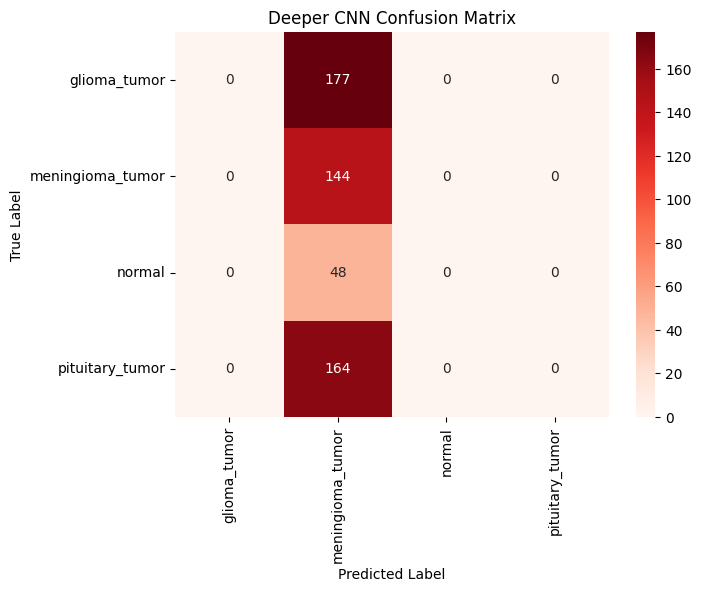

In [56]:
# Plot confusion matrix
conf_matrix = confusion_matrix(
    y_true,
    y_pred
)

plt.figure(figsize=(7, 5))

sns.heatmap(
    conf_matrix,
    annot=True,
    fmt="d",
    cmap="Reds",
    xticklabels=class_names,
    yticklabels=class_names
)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Deeper CNN Confusion Matrix")

plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


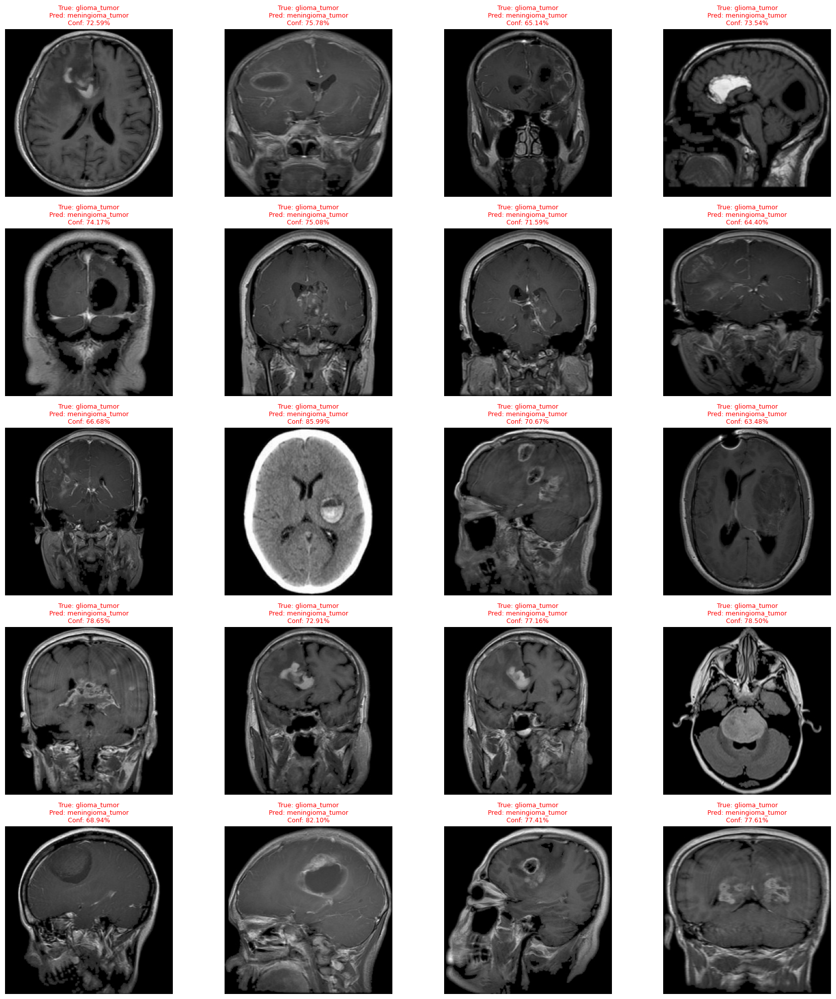

In [57]:
# Display sample predictions from deeper CNN model
test_images, test_labels = next(test_generator)

predictions = deeper_model.predict(test_images)

plt.figure(figsize=(18, 20))

for i in range(20):

    plt.subplot(5, 4, i + 1)

    plt.imshow(test_images[i])

    true_index = np.argmax(test_labels[i])
    pred_index = np.argmax(predictions[i])

    true_label = class_names[true_index]
    predicted_label = class_names[pred_index]

    confidence = predictions[i][pred_index] * 100

    title_color = (
        "green"
        if true_index == pred_index
        else "red"
    )

    plt.title(
        f"True: {true_label}\n"
        f"Pred: {predicted_label}\n"
        f"Conf: {confidence:.2f}%",
        color=title_color,
        fontsize=9
    )

    plt.axis("off")

plt.tight_layout()
plt.show()

In [58]:
# Compare baseline and deeper CNN performance
baseline_best_accuracy = max(
    baseline_history.history["val_accuracy"]
)

baseline_best_loss = min(
    baseline_history.history["val_loss"]
)

deeper_best_accuracy = max(
    deeper_history.history["val_accuracy"]
)

deeper_best_loss = min(
    deeper_history.history["val_loss"]
)

comparison_df = pd.DataFrame({
    "Model": ["Baseline CNN", "Deeper CNN"],
    "Best Validation Accuracy": [
        baseline_best_accuracy,
        deeper_best_accuracy
    ],
    "Best Validation Loss": [
        baseline_best_loss,
        deeper_best_loss
    ]
})

comparison_df

,Model,Best Validation Accuracy,Best Validation Loss
0,Baseline CNN,0.725877,0.726196
1,Deeper CNN,0.291667,1.282440


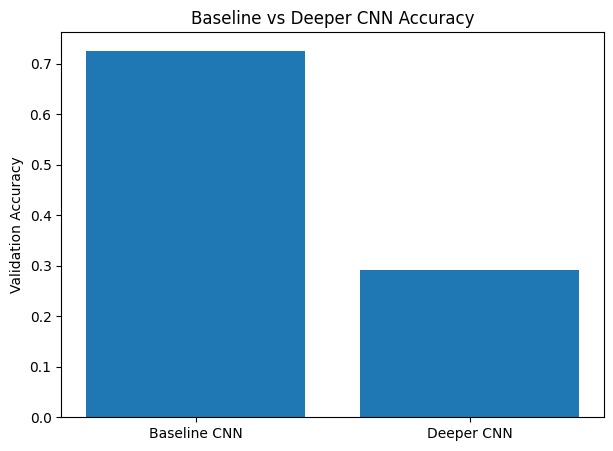

In [59]:
# Visualize model comparison
plt.figure(figsize=(7, 5))

plt.bar(
    comparison_df["Model"],
    comparison_df["Best Validation Accuracy"]
)

plt.ylabel("Validation Accuracy")
plt.title("Baseline vs Deeper CNN Accuracy")

plt.show()

In [60]:
# Import SGD optimizer
from tensorflow.keras.optimizers import SGD

In [61]:
# Build deeper CNN model with SGD optimizer
sgd_model = tf.keras.models.clone_model(deeper_model)

sgd_model.compile(
    optimizer=SGD(
        learning_rate=0.001,
        momentum=0.9
    ),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

print("SGD model compiled successfully.")

SGD model compiled successfully.


In [62]:
# Train deeper CNN model using SGD optimizer
sgd_history = sgd_model.fit(
    train_generator,
    epochs=30,
    validation_data=validation_generator,
    class_weight=class_weight_dict,
    callbacks=callbacks
)

Epoch 1/30
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 566ms/step - accuracy: 0.3127 - loss: 1.7772
Epoch 1: val_accuracy did not improve from 0.72588
58/58 ━━━━━━━━━━━━━━━━━━━━ 50s 666ms/step - accuracy: 0.3460 - loss: 1.5886 - val_accuracy: 0.1404 - val_loss: 1.4244 - learning_rate: 0.0010
Epoch 2/30
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 539ms/step - accuracy: 0.4018 - loss: 1.3322
Epoch 2: val_accuracy did not improve from 0.72588
58/58 ━━━━━━━━━━━━━━━━━━━━ 32s 553ms/step - accuracy: 0.4387 - loss: 1.2677 - val_accuracy: 0.3596 - val_loss: 1.4802 - learning_rate: 0.0010
Epoch 3/30
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 527ms/step - accuracy: 0.4515 - loss: 1.1513
Epoch 3: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 3: val_accuracy did not improve from 0.72588
58/58 ━━━━━━━━━━━━━━━━━━━━ 31s 539ms/step - accuracy: 0.4779 - loss: 1.1423 - val_accuracy: 0.3202 - val_loss: 1.6277 - learning_rate: 0.0010
Epoch 4/30
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 536ms/step - accuracy: 0.5430 - loss: 1.0549


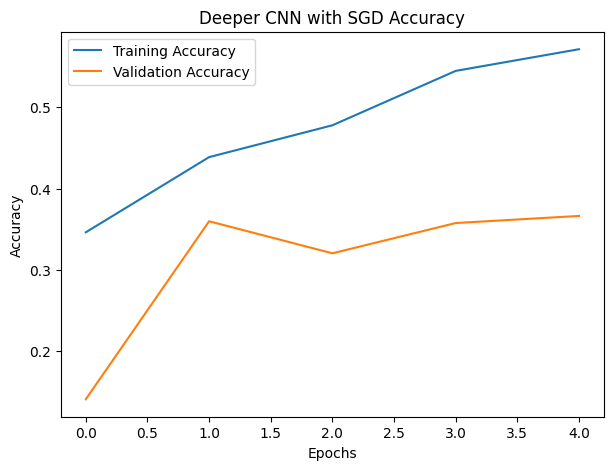

In [63]:
# Plot SGD training and validation accuracy
plt.figure(figsize=(7, 5))

plt.plot(
    sgd_history.history["accuracy"],
    label="Training Accuracy"
)

plt.plot(
    sgd_history.history["val_accuracy"],
    label="Validation Accuracy"
)

plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Deeper CNN with SGD Accuracy")

plt.legend()
plt.show()

In [64]:
# Display best SGD validation results
best_sgd_epoch = np.argmax(
    sgd_history.history["val_accuracy"]
) + 1

best_sgd_accuracy = max(
    sgd_history.history["val_accuracy"]
)

best_sgd_loss = min(
    sgd_history.history["val_loss"]
)

print("Best SGD Epoch:", best_sgd_epoch)

print(
    "Best SGD Validation Accuracy:",
    round(best_sgd_accuracy, 4)
)

print(
    "Best SGD Validation Loss:",
    round(best_sgd_loss, 4)
)

Best SGD Epoch: 5
Best SGD Validation Accuracy: 0.3662
Best SGD Validation Loss: 1.4244


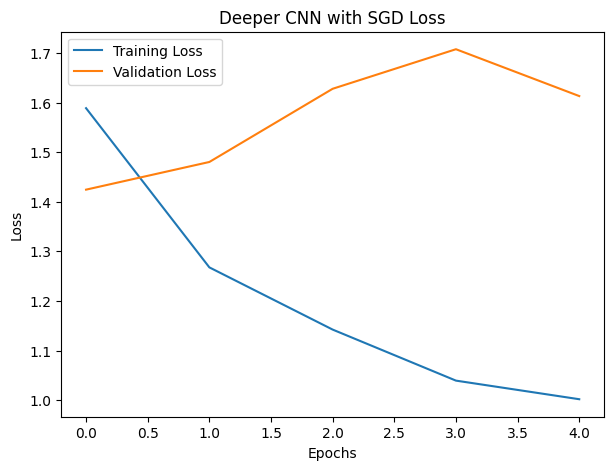

In [65]:
# Plot SGD training and validation loss
plt.figure(figsize=(7, 5))

plt.plot(
    sgd_history.history["loss"],
    label="Training Loss"
)

plt.plot(
    sgd_history.history["val_loss"],
    label="Validation Loss"
)

plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Deeper CNN with SGD Loss")

plt.legend()
plt.show()

In [66]:
# Generate predictions using SGD model
y_pred_probabilities = sgd_model.predict(
    test_generator
)

y_pred = np.argmax(
    y_pred_probabilities,
    axis=1
)

y_true = test_generator.classes

class_names = list(
    test_generator.class_indices.keys()
)

17/17 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step


In [67]:
# Display SGD classification report
print(
    classification_report(
        y_true,
        y_pred,
        target_names=class_names
    )
)

                  precision    recall  f1-score   support

    glioma_tumor       0.44      0.06      0.11       177
meningioma_tumor       0.36      0.03      0.05       144
          normal       0.08      0.85      0.15        48
 pituitary_tumor       0.00      0.00      0.00       164

        accuracy                           0.11       533
       macro avg       0.22      0.24      0.08       533
    weighted avg       0.25      0.11      0.06       533



/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


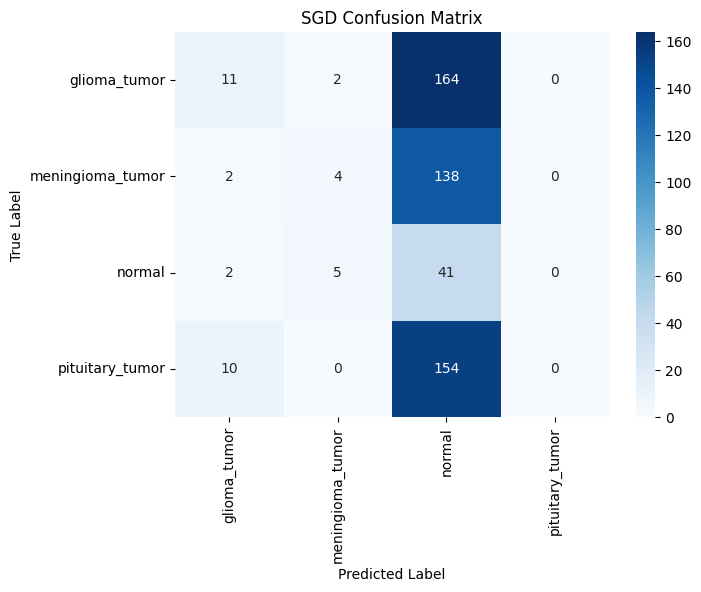

In [68]:
# Plot SGD confusion matrix
conf_matrix = confusion_matrix(
    y_true,
    y_pred
)

plt.figure(figsize=(7, 5))

sns.heatmap(
    conf_matrix,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=class_names,
    yticklabels=class_names
)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("SGD Confusion Matrix")

plt.show()

In [69]:
# Compare Adam and SGD optimizer performance
optimizer_comparison_df = pd.DataFrame({
    "Optimizer": ["Adam", "SGD"],

    "Best Validation Accuracy": [
        max(deeper_history.history["val_accuracy"]),
        max(sgd_history.history["val_accuracy"])
    ],

    "Best Validation Loss": [
        min(deeper_history.history["val_loss"]),
        min(sgd_history.history["val_loss"])
    ]
})

optimizer_comparison_df

,Optimizer,Best Validation Accuracy,Best Validation Loss
0,Adam,0.291667,1.282440
1,SGD,0.366228,1.424378


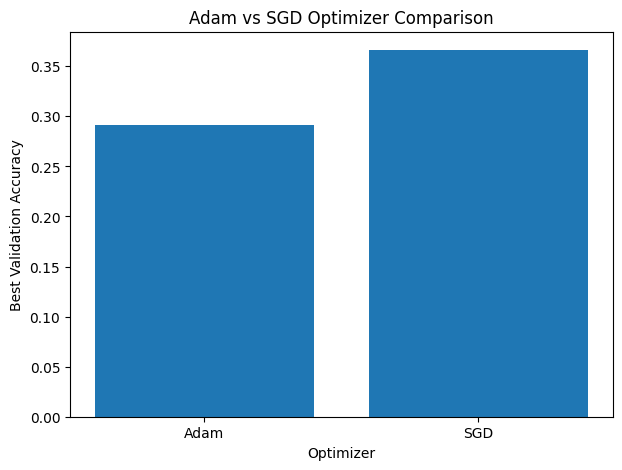

In [70]:
# Visualize Adam vs SGD comparison
plt.figure(figsize=(7, 5))

plt.bar(
    optimizer_comparison_df["Optimizer"],
    optimizer_comparison_df["Best Validation Accuracy"]
)

plt.xlabel("Optimizer")
plt.ylabel("Best Validation Accuracy")
plt.title("Adam vs SGD Optimizer Comparison")

plt.show()

In [71]:
# Import Input layer
from tensorflow.keras import Input

In [72]:
# Ablation model without BatchNormalization

ablation_model = Sequential([

    Conv2D(32, (3, 3), activation="relu", padding="same", input_shape=input_shape),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(64, (3, 3), activation="relu", padding="same"),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(128, (3, 3), activation="relu", padding="same"),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(256, (3, 3), activation="relu", padding="same"),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(512, (3, 3), activation="relu", padding="same"),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(512, (3, 3), activation="relu", padding="same"),
    MaxPooling2D(pool_size=(2, 2)),

    Flatten(),

    Dense(256, activation="relu"),
    Dropout(0.4),

    Dense(128, activation="relu"),
    Dropout(0.4),

    Dense(64, activation="relu"),

    Dense(num_classes, activation="softmax")
])

ablation_model.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_9 (Conv2D)               │ (None, 256, 256, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 128, 128, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 64, 64, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 32, 32, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_12 (MaxPooling2D) │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 16, 16, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_13 (MaxPooling2D) │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 8, 8, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_14 (MaxPooling2D) │ (None, 4, 4, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 256)            │     2,097,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 4)              │           260 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,067,204 (23.14 MB)

 Trainable params: 6,067,204 (23.14 MB)

 Non-trainable params: 0 (0.00 B)

In [73]:
# Compile ablation model
ablation_model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

print("Ablation model compiled successfully.")

Ablation model compiled successfully.


In [74]:
start_time = time.time()

ablation_history = ablation_model.fit(
    train_generator,
    epochs=30,
    validation_data=validation_generator,
    class_weight=class_weight_dict,
    callbacks=callbacks
)

ablation_training_time = time.time() - start_time

print("Ablation Model Training Time:", ablation_training_time, "seconds")

Epoch 1/30
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 597ms/step - accuracy: 0.2693 - loss: 1.4025
Epoch 1: val_accuracy did not improve from 0.72588
58/58 ━━━━━━━━━━━━━━━━━━━━ 45s 632ms/step - accuracy: 0.2665 - loss: 1.3876 - val_accuracy: 0.2917 - val_loss: 1.3866 - learning_rate: 0.0010
Epoch 2/30
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 512ms/step - accuracy: 0.2904 - loss: 1.3889
Epoch 2: val_accuracy did not improve from 0.72588
58/58 ━━━━━━━━━━━━━━━━━━━━ 31s 526ms/step - accuracy: 0.2632 - loss: 1.3882 - val_accuracy: 0.2917 - val_loss: 1.3866 - learning_rate: 0.0010
Epoch 3/30
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 524ms/step - accuracy: 0.2771 - loss: 1.3776
Epoch 3: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 3: val_accuracy did not improve from 0.72588
58/58 ━━━━━━━━━━━━━━━━━━━━ 31s 540ms/step - accuracy: 0.2828 - loss: 1.3870 - val_accuracy: 0.3070 - val_loss: 1.3843 - learning_rate: 0.0010
Epoch 4/30
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 520ms/step - accuracy: 0.2610 - loss: 1.3975


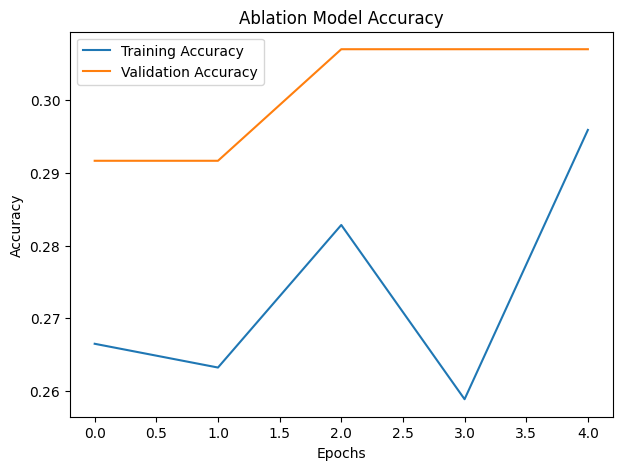

In [75]:
# Plot ablation model accuracy
plt.figure(figsize=(7, 5))

plt.plot(
    ablation_history.history["accuracy"],
    label="Training Accuracy"
)

plt.plot(
    ablation_history.history["val_accuracy"],
    label="Validation Accuracy"
)

plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Ablation Model Accuracy")

plt.legend()
plt.show()

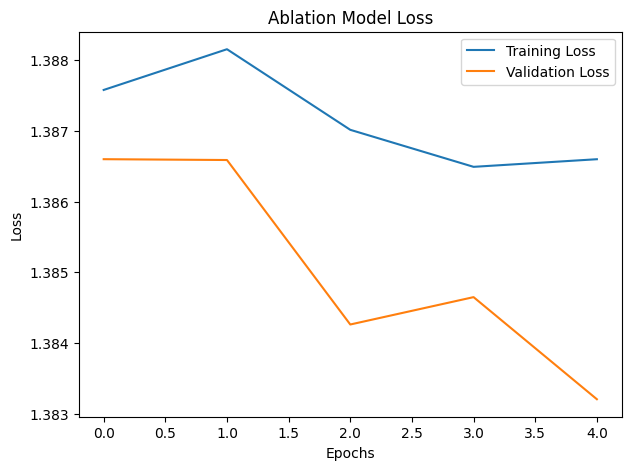

In [76]:
# Plot ablation model loss
plt.figure(figsize=(7, 5))

plt.plot(
    ablation_history.history["loss"],
    label="Training Loss"
)

plt.plot(
    ablation_history.history["val_loss"],
    label="Validation Loss"
)

plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Ablation Model Loss")

plt.legend()
plt.show()

In [77]:
# Compare deeper CNN and ablation model

ablation_comparison_df = pd.DataFrame({
    "Model": [
        "With BatchNormalization",
        "Without BatchNormalization"
    ],

    "Best Validation Accuracy": [
        max(deeper_history.history["val_accuracy"]),
        max(ablation_history.history["val_accuracy"])
    ],

    "Best Validation Loss": [
        min(deeper_history.history["val_loss"]),
        min(ablation_history.history["val_loss"])
    ]
})

print(ablation_comparison_df)

                        Model  Best Validation Accuracy  Best Validation Loss
0     With BatchNormalization                  0.291667              1.282440
1  Without BatchNormalization                  0.307018              1.383203


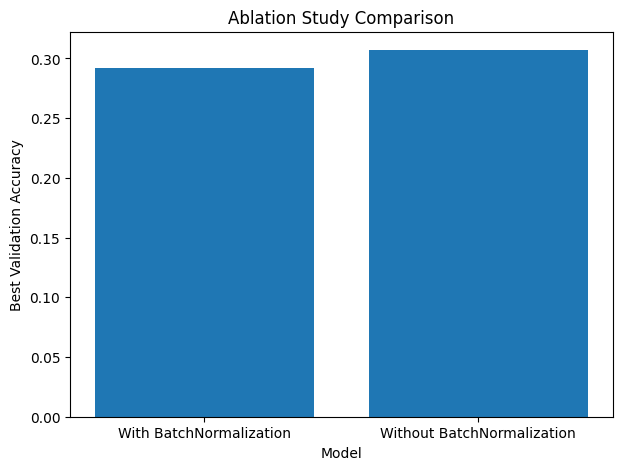

In [78]:
# Visualize ablation study comparison
plt.figure(figsize=(7, 5))

plt.bar(
    ablation_comparison_df["Model"],
    ablation_comparison_df["Best Validation Accuracy"]
)

plt.xlabel("Model")
plt.ylabel("Best Validation Accuracy")
plt.title("Ablation Study Comparison")

plt.show()

In [79]:
# Create final model comparison table
final_comparison_df = pd.DataFrame({

    "Model": [
        "Baseline CNN",
        "Deeper CNN (Adam)",
        "Deeper CNN (SGD)",
        "Deeper CNN Without BatchNormalization"
    ],

    "Best Validation Accuracy": [
        max(baseline_history.history["val_accuracy"]),
        max(deeper_history.history["val_accuracy"]),
        max(sgd_history.history["val_accuracy"]),
        max(ablation_history.history["val_accuracy"])
    ],

    "Best Validation Loss": [
        min(baseline_history.history["val_loss"]),
        min(deeper_history.history["val_loss"]),
        min(sgd_history.history["val_loss"]),
        min(ablation_history.history["val_loss"])
    ]
})

final_comparison_df

,Model,Best Validation Accuracy,Best Validation Loss
0,Baseline CNN,0.725877,0.726196
1,Deeper CNN (Adam),0.291667,1.282440
2,Deeper CNN (SGD),0.366228,1.424378
3,Deeper CNN Without BatchNormalization,0.307018,1.383203


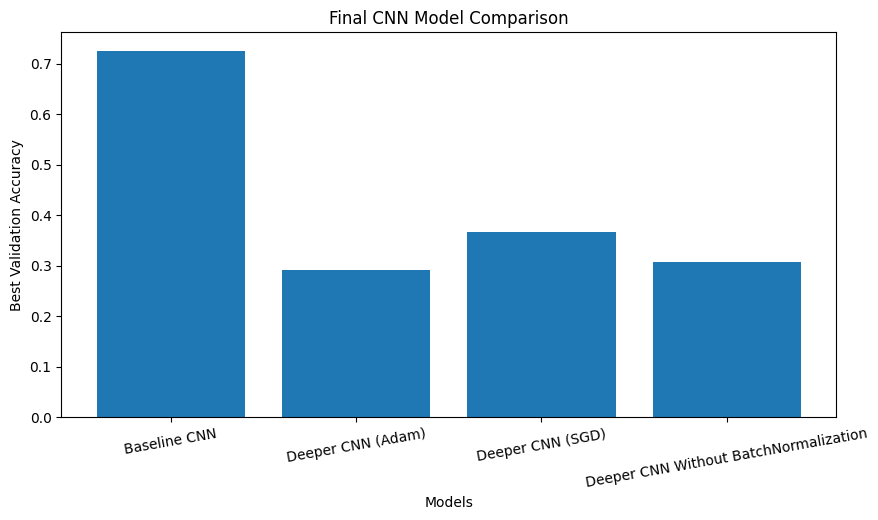

In [80]:
# Visualize final model comparison
plt.figure(figsize=(10, 5))

plt.bar(
    final_comparison_df["Model"],
    final_comparison_df["Best Validation Accuracy"]
)

plt.xticks(rotation=10)

plt.xlabel("Models")
plt.ylabel("Best Validation Accuracy")
plt.title("Final CNN Model Comparison")

plt.show()

In [81]:
final_comparison_df.to_csv(
    "/content/drive/MyDrive/final_model_comparison.csv",
    index=False
)

In [82]:
# Import libraries for transfer learning using MobileNetV2

from tensorflow.keras.applications import MobileNetV2

from tensorflow.keras.applications.mobilenet_v2 import (
    preprocess_input
)

from tensorflow.keras.models import Model

from tensorflow.keras.layers import (
    Input,
    Dense,
    Dropout,
    GlobalAveragePooling2D
)

In [83]:
# Configure image preprocessing for MobileNetV2

image_size = 224
batch_size = 32

train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=20,
    width_shift_range=0.10,
    height_shift_range=0.10,
    zoom_range=0.10,
    horizontal_flip=True,
    validation_split=0.20
)

validation_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    validation_split=0.20
)

test_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

In [84]:
# Create training, validation, and testing generators for MobileNetV2

mobilenet_train_generator = train_datagen.flow_from_directory(
    train_path,
    target_size=(image_size, image_size),
    batch_size=batch_size,
    class_mode="categorical",
    subset="training",
    shuffle=True
)

mobilenet_validation_generator = validation_datagen.flow_from_directory(
    train_path,
    target_size=(image_size, image_size),
    batch_size=batch_size,
    class_mode="categorical",
    subset="validation",
    shuffle=False
)

mobilenet_test_generator = test_datagen.flow_from_directory(
    test_path,
    target_size=(image_size, image_size),
    batch_size=batch_size,
    class_mode="categorical",
    shuffle=False
)

print("Training Samples:", mobilenet_train_generator.samples)
print("Validation Samples:", mobilenet_validation_generator.samples)
print("Testing Samples:", mobilenet_test_generator.samples)

print("\nClass Indices:")
print(mobilenet_train_generator.class_indices)

Found 1835 images belonging to 4 classes.
Found 456 images belonging to 4 classes.
Found 533 images belonging to 4 classes.
Training Samples: 1835
Validation Samples: 456
Testing Samples: 533

Class Indices:
{'glioma_tumor': 0, 'meningioma_tumor': 1, 'normal': 2, 'pituitary_tumor': 3}


In [85]:
# Calculate class weights for MobileNetV2 training

mobilenet_class_weights = compute_class_weight(
    class_weight="balanced",
    classes=np.unique(mobilenet_train_generator.classes),
    y=mobilenet_train_generator.classes
)

mobilenet_class_weight_dict = dict(enumerate(mobilenet_class_weights))

print("MobileNetV2 Class Weights:")
print(mobilenet_class_weight_dict)

MobileNetV2 Class Weights:
{0: np.float64(0.8177361853832442), 1: np.float64(0.8574766355140186), 2: np.float64(2.2055288461538463), 3: np.float64(0.8639359698681732)}


In [86]:
# Load MobileNetV2 base model with ImageNet weights

base_model = MobileNetV2(
    weights="imagenet",
    include_top=False,
    input_shape=(image_size, image_size, 3)
)

# Freeze convolutional base for feature extraction
base_model.trainable = False

print("MobileNetV2 base model loaded successfully.")

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
MobileNetV2 base model loaded successfully.


In [87]:
# Build custom classification head for MobileNetV2

x = base_model.output

x = GlobalAveragePooling2D()(x)

x = Dense(128, activation="relu")(x)

x = Dropout(0.4)(x)

output_layer = Dense(
    num_classes,
    activation="softmax"
)(x)

# Create final transfer learning model
mobilenet_model = Model(
    inputs=base_model.input,
    outputs=output_layer
)

mobilenet_model.summary()

Model: "functional_29"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 112, 112,  │        864 │ input_layer_3[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 112, 112,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 112, 112,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 112, 112,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 112, 112,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 112, 112,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 113, 113,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 56, 56,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 56, 56,    │      2,304 │ block_1_depthwis

 Total params: 2,422,468 (9.24 MB)

 Trainable params: 164,484 (642.52 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [88]:
# Compile MobileNetV2 feature extraction model

mobilenet_model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

print("MobileNetV2 feature extraction model compiled successfully.")

MobileNetV2 feature extraction model compiled successfully.


In [89]:
# Define callbacks for MobileNetV2 feature extraction

mobilenet_checkpoint = ModelCheckpoint(
    "mobilenet_feature_extraction_best_model.keras",
    monitor="val_accuracy",
    save_best_only=True,
    verbose=1
)

mobilenet_callbacks = [
    early_stopping,
    reduce_lr,
    mobilenet_checkpoint
]

In [90]:
# Train MobileNetV2 feature extraction model

mobilenet_history = mobilenet_model.fit(
    mobilenet_train_generator,
    epochs=20,
    validation_data=mobilenet_validation_generator,
    class_weight=mobilenet_class_weight_dict,
    callbacks=mobilenet_callbacks
)

Epoch 1/20
57/58 ━━━━━━━━━━━━━━━━━━━━ 0s 599ms/step - accuracy: 0.5084 - loss: 1.1458
Epoch 1: val_accuracy improved from None to 0.69298, saving model to mobilenet_feature_extraction_best_model.keras

Epoch 1: finished saving model to mobilenet_feature_extraction_best_model.keras
58/58 ━━━━━━━━━━━━━━━━━━━━ 74s 918ms/step - accuracy: 0.6278 - loss: 0.9134 - val_accuracy: 0.6930 - val_loss: 0.7297 - learning_rate: 0.0010
Epoch 2/20
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step - accuracy: 0.7636 - loss: 0.5829
Epoch 2: val_accuracy improved from 0.69298 to 0.73026, saving model to mobilenet_feature_extraction_best_model.keras

Epoch 2: finished saving model to mobilenet_feature_extraction_best_model.keras
58/58 ━━━━━━━━━━━━━━━━━━━━ 24s 401ms/step - accuracy: 0.7629 - loss: 0.5764 - val_accuracy: 0.7303 - val_loss: 0.7062 - learning_rate: 0.0010
Epoch 3/20
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 408ms/step - accuracy: 0.7916 - loss: 0.4929
Epoch 3: val_accuracy improved from 0.73026 to 0.76535, saving 

In [91]:
# Load best MobileNetV2 feature extraction model

mobilenet_model = tf.keras.models.load_model(
    "mobilenet_feature_extraction_best_model.keras"
)

print("Best MobileNetV2 model loaded successfully.")

Best MobileNetV2 model loaded successfully.


In [92]:
# Display best validation results for MobileNetV2

best_epoch = np.argmax(
    mobilenet_history.history["val_accuracy"]
) + 1

best_val_accuracy = max(
    mobilenet_history.history["val_accuracy"]
)

best_val_loss = min(
    mobilenet_history.history["val_loss"]
)

print("Best Epoch:", best_epoch)

print(
    "Best Validation Accuracy:",
    round(best_val_accuracy, 4)
)

print(
    "Best Validation Loss:",
    round(best_val_loss, 4)
)

Best Epoch: 14
Best Validation Accuracy: 0.8246
Best Validation Loss: 0.4795


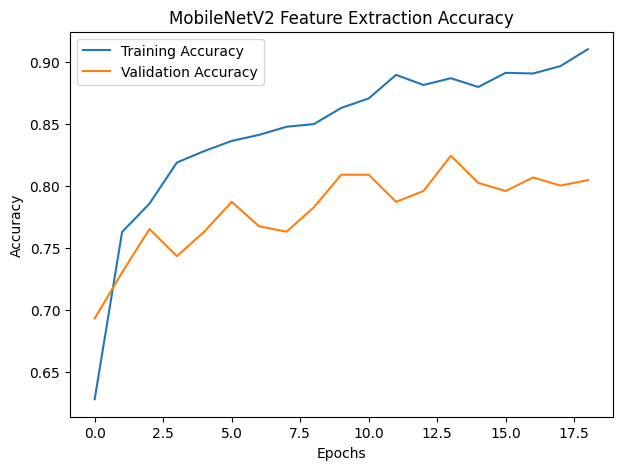

In [93]:
# Plot MobileNetV2 training and validation accuracy
plt.figure(figsize=(7, 5))

plt.plot(
    mobilenet_history.history["accuracy"],
    label="Training Accuracy"
)

plt.plot(
    mobilenet_history.history["val_accuracy"],
    label="Validation Accuracy"
)

plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("MobileNetV2 Feature Extraction Accuracy")

plt.legend()
plt.show()

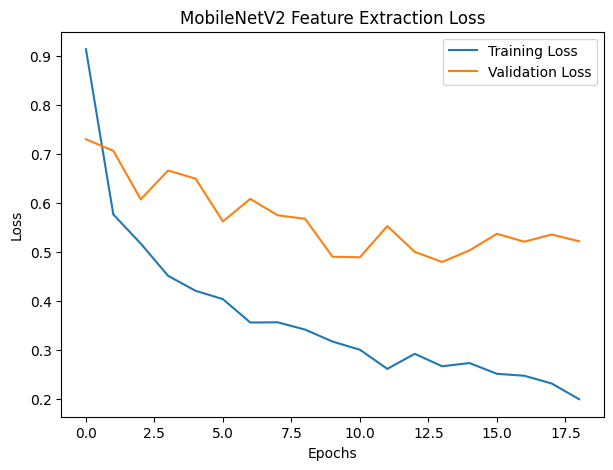

In [94]:
# Plot MobileNetV2 training and validation loss
plt.figure(figsize=(7, 5))

plt.plot(
    mobilenet_history.history["loss"],
    label="Training Loss"
)

plt.plot(
    mobilenet_history.history["val_loss"],
    label="Validation Loss"
)

plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("MobileNetV2 Feature Extraction Loss")

plt.legend()
plt.show()

In [95]:
# Generate predictions using MobileNetV2 feature extraction model
y_pred_probabilities = mobilenet_model.predict(
    mobilenet_test_generator
)

y_pred = np.argmax(
    y_pred_probabilities,
    axis=1
)

y_true = mobilenet_test_generator.classes

class_names = list(
    mobilenet_test_generator.class_indices.keys()
)

17/17 ━━━━━━━━━━━━━━━━━━━━ 21s 927ms/step


In [96]:
# Display classification report
print(
    classification_report(
        y_true,
        y_pred,
        target_names=class_names
    )
)

                  precision    recall  f1-score   support

    glioma_tumor       0.98      0.74      0.84       177
meningioma_tumor       0.72      0.85      0.78       144
          normal       0.89      0.85      0.87        48
 pituitary_tumor       0.87      0.97      0.92       164

        accuracy                           0.85       533
       macro avg       0.87      0.85      0.85       533
    weighted avg       0.87      0.85      0.85       533



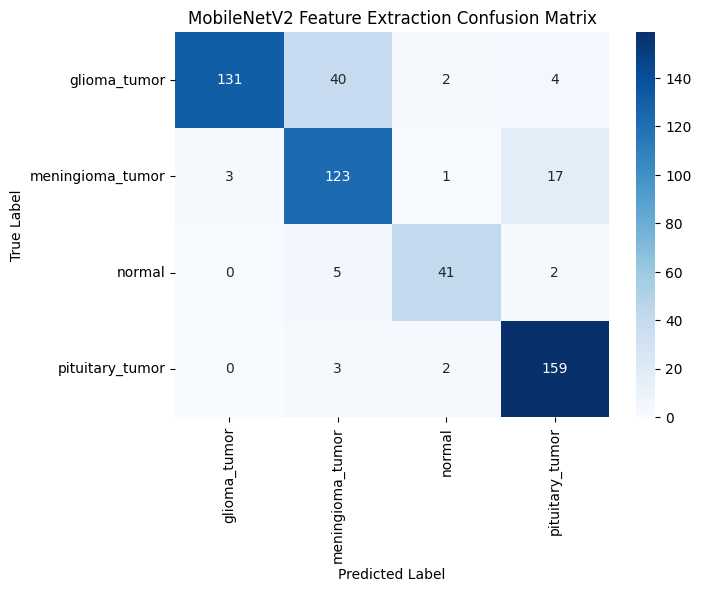

In [97]:
# Plot MobileNetV2 confusion matrix
conf_matrix = confusion_matrix(
    y_true,
    y_pred
)

plt.figure(figsize=(7, 5))

sns.heatmap(
    conf_matrix,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=class_names,
    yticklabels=class_names
)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("MobileNetV2 Feature Extraction Confusion Matrix")

plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 14s 14s/step


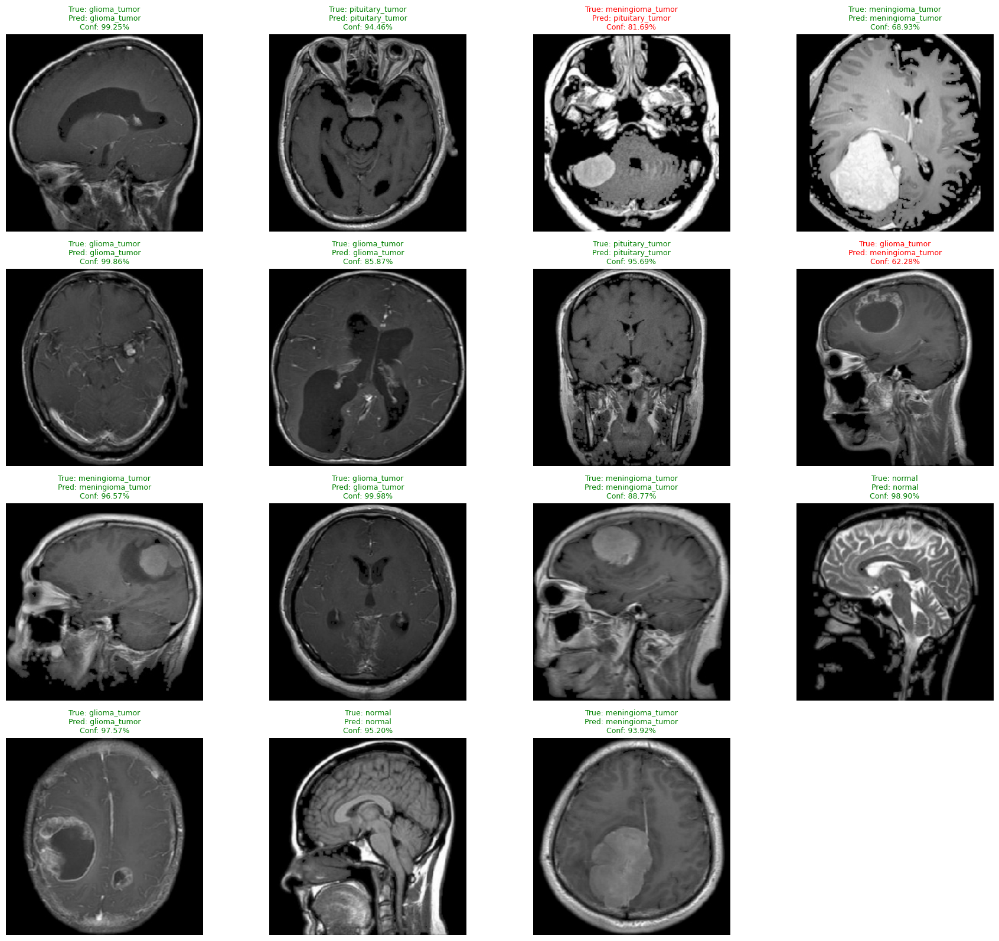

In [98]:
# Display random sample predictions from test dataset
mobilenet_test_generator.reset()

all_images = []
all_labels = []

for images, labels in mobilenet_test_generator:
    all_images.append(images)
    all_labels.append(labels)

    if len(all_images) * batch_size >= mobilenet_test_generator.samples:
        break

all_images = np.vstack(all_images)
all_labels = np.vstack(all_labels)

random_indices = np.random.choice(
    len(all_images),
    size=20,
    replace=False
)

sample_images = all_images[random_indices]
sample_labels = all_labels[random_indices]

predictions = mobilenet_model.predict(sample_images)

plt.figure(figsize=(18, 20))

for i in range(15):

    plt.subplot(5, 4, i + 1)

    image = sample_images[i]
    image = (image - image.min()) / (image.max() - image.min())

    plt.imshow(image)

    true_index = np.argmax(sample_labels[i])
    pred_index = np.argmax(predictions[i])

    true_label = class_names[true_index]
    predicted_label = class_names[pred_index]
    confidence = predictions[i][pred_index] * 100

    title_color = "green" if true_index == pred_index else "red"

    plt.title(
        f"True: {true_label}\nPred: {predicted_label}\nConf: {confidence:.2f}%",
        color=title_color,
        fontsize=9
    )

    plt.axis("off")

plt.tight_layout()
plt.show()

In [99]:
# Unfreeze last layers of MobileNetV2 for fine-tuning
base_model.trainable = True

for layer in base_model.layers[:-30]:
    layer.trainable = False

print("Fine-tuning enabled for last MobileNetV2 layers.")

Fine-tuning enabled for last MobileNetV2 layers.


In [100]:
# Compile MobileNetV2 model for fine-tuning
mobilenet_model.compile(
    optimizer=Adam(learning_rate=0.00001),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

print("MobileNetV2 fine-tuning model compiled successfully.")

MobileNetV2 fine-tuning model compiled successfully.


In [101]:
# Define checkpoint for fine-tuning phase
fine_tune_checkpoint = ModelCheckpoint(
    "mobilenet_finetune_best_model.keras",
    monitor="val_accuracy",
    save_best_only=True,
    verbose=1
)

fine_tune_callbacks = [
    early_stopping,
    reduce_lr,
    fine_tune_checkpoint
]

In [102]:
# Train MobileNetV2 fine-tuning model
fine_tune_history = mobilenet_model.fit(
    mobilenet_train_generator,
    epochs=15,
    validation_data=mobilenet_validation_generator,
    class_weight=mobilenet_class_weight_dict,
    callbacks=fine_tune_callbacks
)

Epoch 1/15
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step - accuracy: 0.8918 - loss: 0.2507
Epoch 1: val_accuracy improved from None to 0.81140, saving model to mobilenet_finetune_best_model.keras

Epoch 1: finished saving model to mobilenet_finetune_best_model.keras
58/58 ━━━━━━━━━━━━━━━━━━━━ 50s 654ms/step - accuracy: 0.8921 - loss: 0.2467 - val_accuracy: 0.8114 - val_loss: 0.4804 - learning_rate: 1.0000e-05
Epoch 2/15
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step - accuracy: 0.8924 - loss: 0.2479
Epoch 2: val_accuracy did not improve from 0.81140
58/58 ━━━━━━━━━━━━━━━━━━━━ 23s 392ms/step - accuracy: 0.8975 - loss: 0.2424 - val_accuracy: 0.8114 - val_loss: 0.4838 - learning_rate: 1.0000e-05
Epoch 3/15
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 394ms/step - accuracy: 0.8947 - loss: 0.2396
Epoch 3: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-06.

Epoch 3: val_accuracy improved from 0.81140 to 0.81360, saving model to mobilenet_finetune_best_model.keras

Epoch 3: finished saving model to mob

In [103]:
# Load best fine-tuned MobileNetV2 model
mobilenet_model = tf.keras.models.load_model(
    "mobilenet_finetune_best_model.keras"
)

print("Best fine-tuned MobileNetV2 model loaded successfully.")

Best fine-tuned MobileNetV2 model loaded successfully.


In [104]:
# Display best fine-tuning validation results
best_epoch = np.argmax(
    fine_tune_history.history["val_accuracy"]
) + 1

best_val_accuracy = max(
    fine_tune_history.history["val_accuracy"]
)

best_val_loss = min(
    fine_tune_history.history["val_loss"]
)

print("Best Epoch:", best_epoch)

print(
    "Best Validation Accuracy:",
    round(best_val_accuracy, 4)
)

print(
    "Best Validation Loss:",
    round(best_val_loss, 4)
)

Best Epoch: 3
Best Validation Accuracy: 0.8136
Best Validation Loss: 0.4804


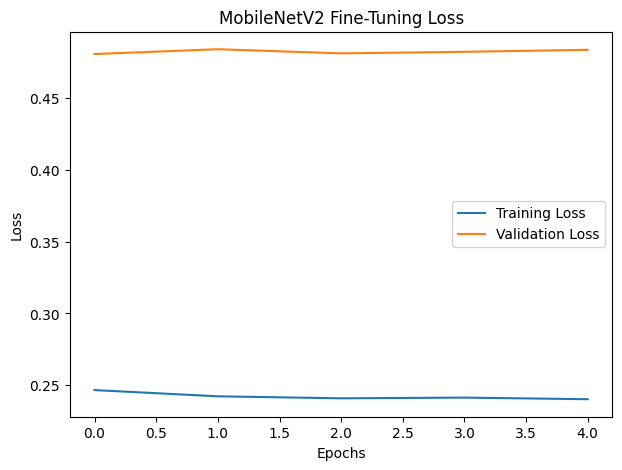

In [105]:
# Plot fine-tuning training and validation loss
plt.figure(figsize=(7, 5))

plt.plot(
    fine_tune_history.history["loss"],
    label="Training Loss"
)

plt.plot(
    fine_tune_history.history["val_loss"],
    label="Validation Loss"
)

plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("MobileNetV2 Fine-Tuning Loss")

plt.legend()
plt.show()

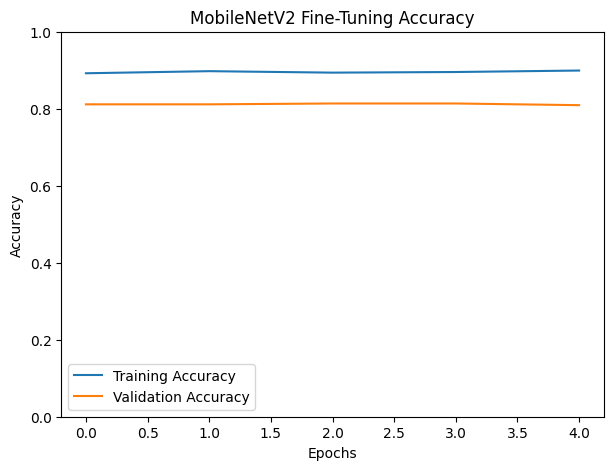

In [106]:
# Plot fine-tuning training and validation accuracy
plt.figure(figsize=(7, 5))

plt.plot(
    fine_tune_history.history["accuracy"],
    label="Training Accuracy"
)

plt.plot(
    fine_tune_history.history["val_accuracy"],
    label="Validation Accuracy"
)

plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("MobileNetV2 Fine-Tuning Accuracy")

plt.ylim(0, 1)

plt.legend()
plt.show()

In [107]:
# Generate predictions using fine-tuned MobileNetV2 model
y_pred_probabilities = mobilenet_model.predict(
    mobilenet_test_generator
)

y_pred = np.argmax(
    y_pred_probabilities,
    axis=1
)

y_true = mobilenet_test_generator.classes

class_names = list(
    mobilenet_test_generator.class_indices.keys()
)

17/17 ━━━━━━━━━━━━━━━━━━━━ 13s 352ms/step


In [108]:
# classification report
print(
    classification_report(
        y_true,
        y_pred,
        target_names=class_names
    )
)

                  precision    recall  f1-score   support

    glioma_tumor       0.97      0.81      0.88       177
meningioma_tumor       0.79      0.81      0.80       144
          normal       0.89      0.85      0.87        48
 pituitary_tumor       0.85      0.99      0.91       164

        accuracy                           0.87       533
       macro avg       0.87      0.87      0.87       533
    weighted avg       0.88      0.87      0.87       533



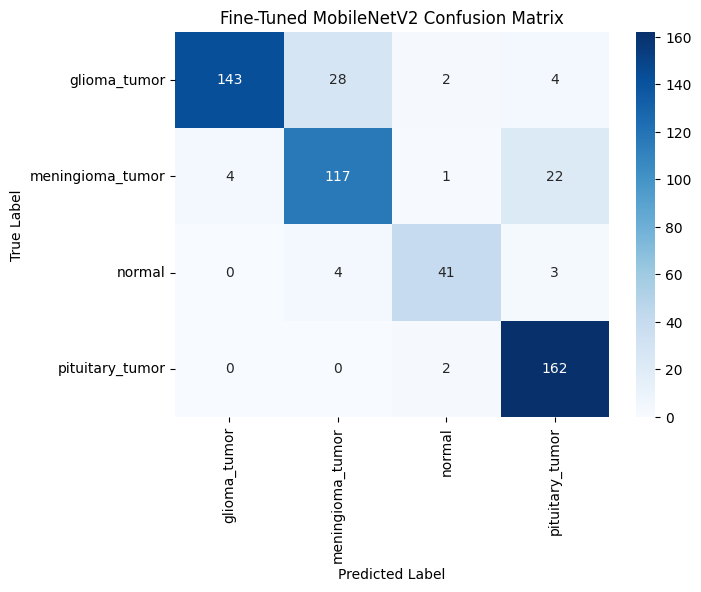

In [109]:
# Plot fine-tuned MobileNetV2 confusion matrix
conf_matrix = confusion_matrix(
    y_true,
    y_pred
)

plt.figure(figsize=(7, 5))

sns.heatmap(
    conf_matrix,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=class_names,
    yticklabels=class_names
)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Fine-Tuned MobileNetV2 Confusion Matrix")

plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step


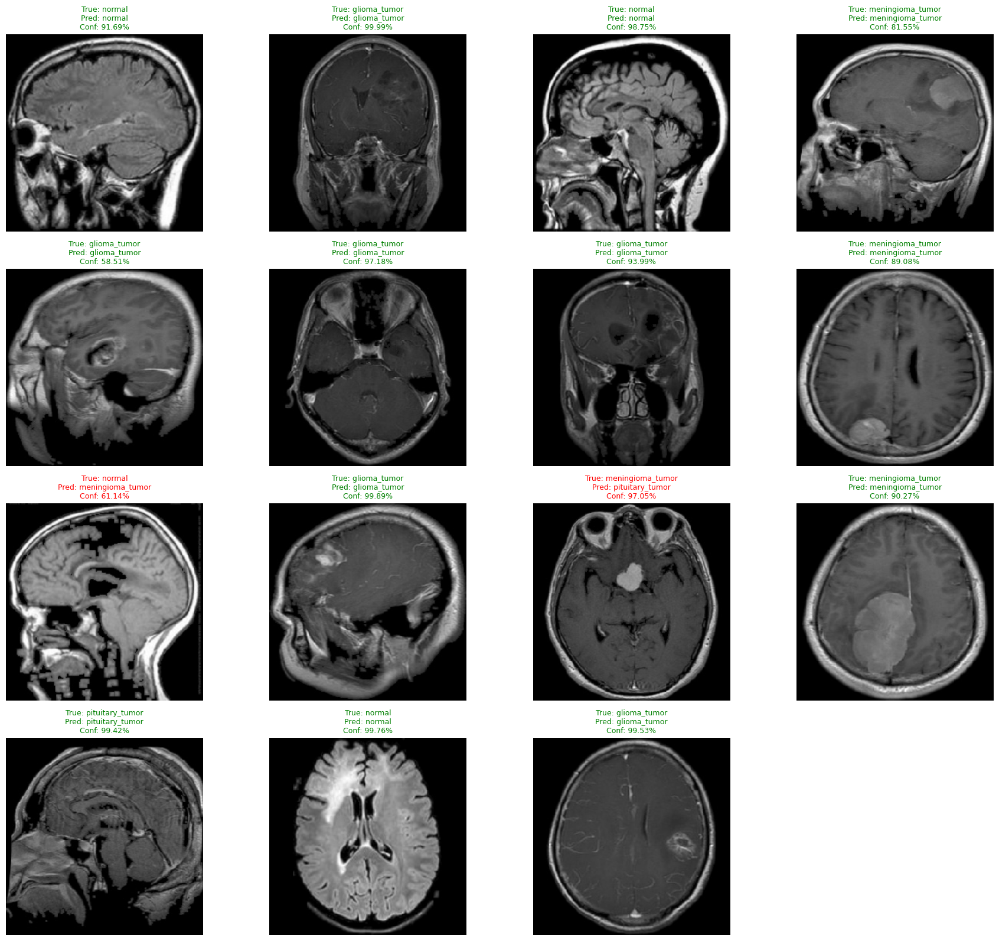

In [110]:
# Display sample predictions from fine-tuned MobileNetV2 model
mobilenet_test_generator.reset()

all_images = []
all_labels = []

for images, labels in mobilenet_test_generator:

    all_images.append(images)
    all_labels.append(labels)

    if len(all_images) * batch_size >= mobilenet_test_generator.samples:
        break

all_images = np.vstack(all_images)
all_labels = np.vstack(all_labels)

random_indices = np.random.choice(
    len(all_images),
    size=20,
    replace=False
)

sample_images = all_images[random_indices]
sample_labels = all_labels[random_indices]

predictions = mobilenet_model.predict(sample_images)

plt.figure(figsize=(18, 20))

for i in range(15):

    plt.subplot(5, 4, i + 1)

    image = sample_images[i]

    image = (image - image.min()) / (
        image.max() - image.min()
    )

    plt.imshow(image)

    true_index = np.argmax(sample_labels[i])
    pred_index = np.argmax(predictions[i])

    true_label = class_names[true_index]
    predicted_label = class_names[pred_index]

    confidence = predictions[i][pred_index] * 100

    title_color = (
        "green"
        if true_index == pred_index
        else "red"
    )

    plt.title(
        f"True: {true_label}\n"
        f"Pred: {predicted_label}\n"
        f"Conf: {confidence:.2f}%",
        color=title_color,
        fontsize=9
    )

    plt.axis("off")

plt.tight_layout()
plt.show()

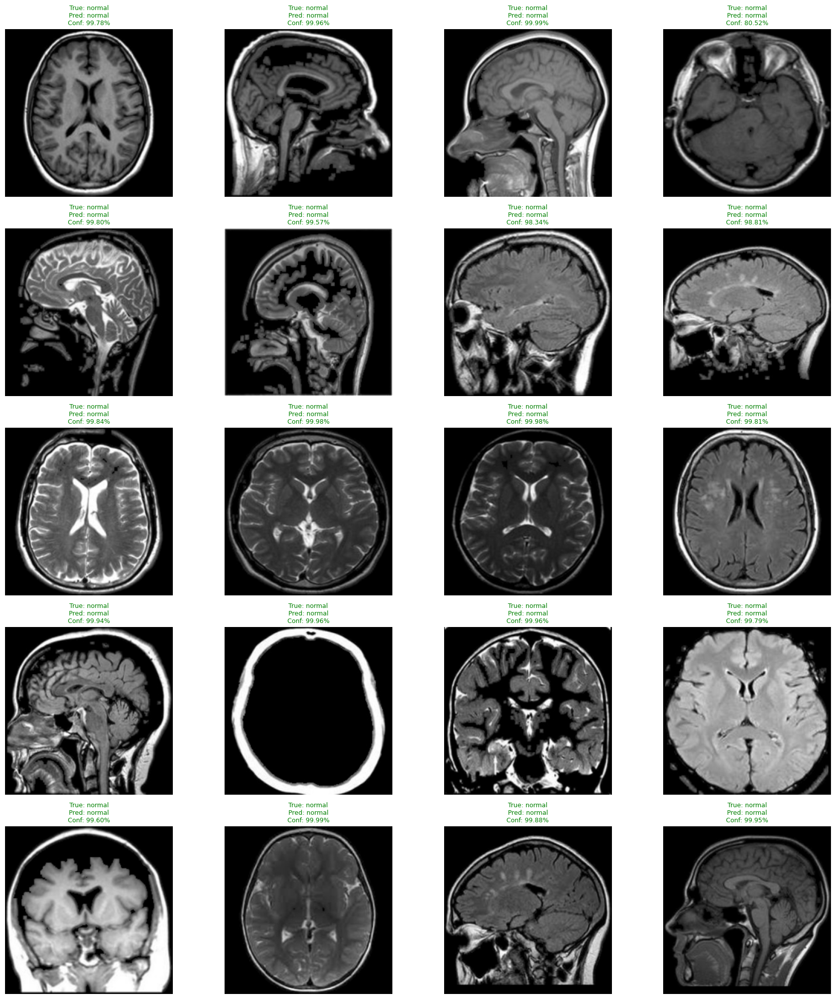

In [111]:
# Display sample predictions only for normal class
normal_class_path = os.path.join(
    test_path,
    "normal"
)

normal_images = os.listdir(normal_class_path)

selected_images = random.sample(
    normal_images,
    20
)

plt.figure(figsize=(18, 20))

for i, image_file in enumerate(selected_images):

    image_path = os.path.join(
        normal_class_path,
        image_file
    )

    image = Image.open(image_path).convert("RGB")

    image = image.resize(
        (image_size, image_size)
    )

    image_array = np.array(image)

    processed_image = preprocess_input(
        image_array.astype(np.float32)
    )

    processed_image = np.expand_dims(
        processed_image,
        axis=0
    )

    prediction = mobilenet_model.predict(
        processed_image,
        verbose=0
    )

    pred_index = np.argmax(prediction)

    predicted_label = class_names[pred_index]

    confidence = prediction[0][pred_index] * 100

    title_color = (
        "green"
        if predicted_label == "normal"
        else "red"
    )

    normalized_image = (
        image_array - image_array.min()
    ) / (
        image_array.max() - image_array.min()
    )

    plt.subplot(5, 4, i + 1)

    plt.imshow(normalized_image)

    plt.title(
        f"True: normal\n"
        f"Pred: {predicted_label}\n"
        f"Conf: {confidence:.2f}%",
        color=title_color,
        fontsize=9
    )

    plt.axis("off")

plt.tight_layout()
plt.show()

In [112]:
# Compare all CNN and transfer learning models
final_transfer_comparison_df = pd.DataFrame({

    "Model": [
        "Baseline CNN",
        "Deeper CNN (Adam)",
        "Deeper CNN (SGD)",
        "Deeper CNN Without Batch Normalization",
        "MobileNetV2 Feature Extraction",
        "MobileNetV2 Fine-Tuning"
    ],

    "Best Validation Accuracy": [
        max(baseline_history.history["val_accuracy"]),
        max(deeper_history.history["val_accuracy"]),
        max(sgd_history.history["val_accuracy"]),
        max(ablation_history.history["val_accuracy"]),
        max(mobilenet_history.history["val_accuracy"]),
        max(fine_tune_history.history["val_accuracy"])
    ],

    "Best Validation Loss": [
        min(baseline_history.history["val_loss"]),
        min(deeper_history.history["val_loss"]),
        min(sgd_history.history["val_loss"]),
        min(ablation_history.history["val_loss"]),
        min(mobilenet_history.history["val_loss"]),
        min(fine_tune_history.history["val_loss"])
    ]
})

final_transfer_comparison_df

,Model,Best Validation Accuracy,Best Validation Loss
0,Baseline CNN,0.725877,0.726196
1,Deeper CNN (Adam),0.291667,1.282440
2,Deeper CNN (SGD),0.366228,1.424378
3,Deeper CNN Without Batch Normalization,0.307018,1.383203
4,MobileNetV2 Feature Extraction,0.824561,0.479505
5,MobileNetV2 Fine-Tuning,0.813596,0.480413


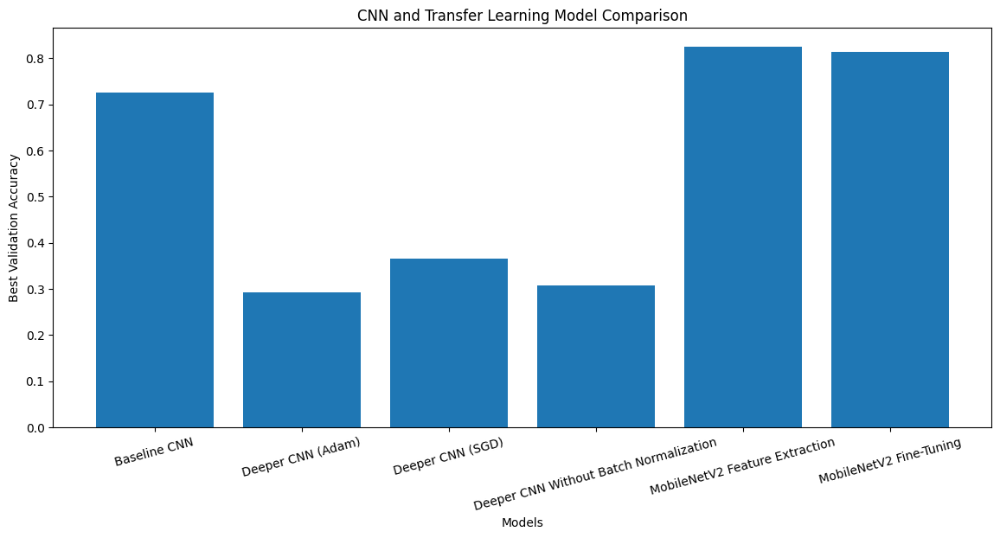

In [113]:
# Visualize final model comparison
plt.figure(figsize=(14, 6))

plt.bar(
    final_transfer_comparison_df["Model"],
    final_transfer_comparison_df["Best Validation Accuracy"]
)

plt.xticks(rotation=15)

plt.xlabel("Models")
plt.ylabel("Best Validation Accuracy")
plt.title("CNN and Transfer Learning Model Comparison")

plt.show()

In [114]:
# Save final transfer learning comparison table to Google Drive
final_transfer_comparison_df.to_csv(
    "/content/drive/MyDrive/finall_transfer_learning_comparison.csv",
    index=False
)

print("Final transfer learning comparison saved to Google Drive successfully.")

Final transfer learning comparison saved to Google Drive successfully.


In [115]:
# Compare training and validation accuracy of all approaches
accuracy_comparison_df = pd.DataFrame({

    "Model": [
        "Baseline CNN",
        "Deeper CNN (Adam)",
        "Deeper CNN (SGD)",
        "Deeper CNN Without Batch Normalization",
        "MobileNetV2 Feature Extraction",
        "MobileNetV2 Fine-Tuning"
    ],

    "Best Training Accuracy": [
        max(baseline_history.history["accuracy"]),
        max(deeper_history.history["accuracy"]),
        max(sgd_history.history["accuracy"]),
        max(ablation_history.history["accuracy"]),
        max(mobilenet_history.history["accuracy"]),
        max(fine_tune_history.history["accuracy"])
    ],

    "Best Validation Accuracy": [
        max(baseline_history.history["val_accuracy"]),
        max(deeper_history.history["val_accuracy"]),
        max(sgd_history.history["val_accuracy"]),
        max(ablation_history.history["val_accuracy"]),
        max(mobilenet_history.history["val_accuracy"]),
        max(fine_tune_history.history["val_accuracy"])
    ]
})

accuracy_comparison_df

,Model,Best Training Accuracy,Best Validation Accuracy
0,Baseline CNN,0.810354,0.725877
1,Deeper CNN (Adam),0.529700,0.291667
2,Deeper CNN (SGD),0.571662,0.366228
3,Deeper CNN Without Batch Normalization,0.295913,0.307018
4,MobileNetV2 Feature Extraction,0.910627,0.824561
5,MobileNetV2 Fine-Tuning,0.899183,0.813596


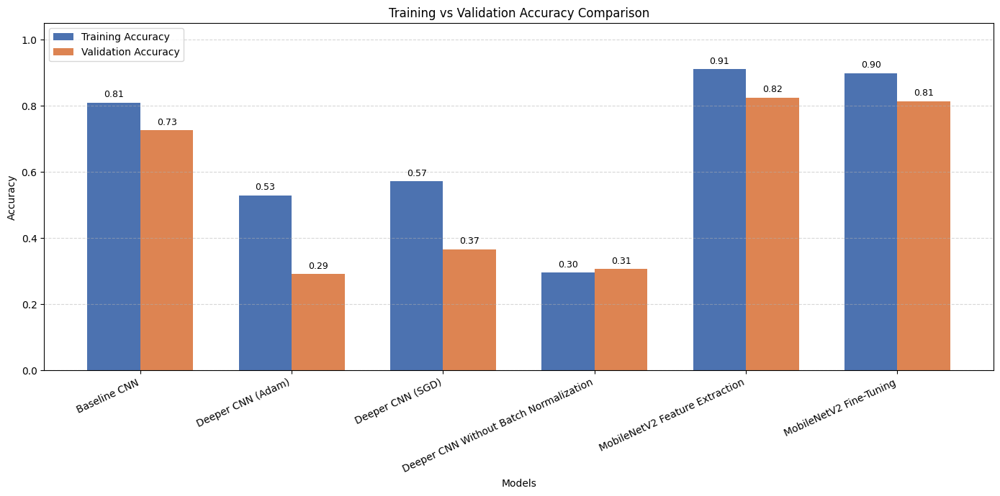

In [117]:
# Visualize training and validation accuracy comparison with colors

x = np.arange(len(accuracy_comparison_df))
width = 0.35

plt.figure(figsize=(14, 7))

colors_train = "#4C72B0"   # blue
colors_val = "#DD8452"     # orange

bars1 = plt.bar(
    x - width / 2,
    accuracy_comparison_df["Best Training Accuracy"],
    width,
    label="Training Accuracy",
    color=colors_train
)

bars2 = plt.bar(
    x + width / 2,
    accuracy_comparison_df["Best Validation Accuracy"],
    width,
    label="Validation Accuracy",
    color=colors_val
)

# Add value labels
for bar in bars1 + bars2:
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        height + 0.01,
        f"{height:.2f}",
        ha="center",
        va="bottom",
        fontsize=9
    )

plt.xticks(
    x,
    accuracy_comparison_df["Model"],
    rotation=25,
    ha="right"
)

plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Training vs Validation Accuracy Comparison")

plt.ylim(0, 1.05)
plt.grid(axis="y", linestyle="--", alpha=0.5)

plt.legend()
plt.tight_layout()
plt.show()

In [119]:
# Save all training histories to Google Drive

pd.DataFrame(baseline_history.history).to_csv(
    "/content/drive/MyDrive/baseline_history.csv",
    index=False
)

pd.DataFrame(deeper_history.history).to_csv(
    "/content/drive/MyDrive/deeper_adam_history.csv",
    index=False
)

pd.DataFrame(sgd_history.history).to_csv(
    "/content/drive/MyDrive/deeper_sgd_history.csv",
    index=False
)

pd.DataFrame(ablation_history.history).to_csv(
    "/content/drive/MyDrive/ablation_history.csv",
    index=False
)

pd.DataFrame(mobilenet_history.history).to_csv(
    "/content/drive/MyDrive/mobilenet_feature_extraction_history.csv",
    index=False
)

pd.DataFrame(fine_tune_history.history).to_csv(
    "/content/drive/MyDrive/mobilenet_finetune_history.csv",
    index=False
)

print("All training histories saved successfully.")

All training histories saved successfully.
